# Inversion of a 2D wellfield with GAN and gradual parametrization deformation

- Importation of the required modules

In [50]:
import logging
from pathlib import Path
from typing import Tuple, Sequence, Iterable, Union, List, Generator, Optional
import os
import copy
import pyrtid
from pyrtid.utils.wellfield import gen_wells_coordinates
import pyrtid.forward as dmfwd
import pyrtid.inverse as dminv
import pyrtid.utils.spde as spde
from pyrtid.utils import indices_to_node_number
from pyrtid.utils import GaussianFilter, indices_to_node_number, node_number_to_indices
from pyrtid.inverse.params import (
    get_gridded_archived_gradients,
    get_param_values,
)
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
from matplotlib.animation import HTMLWriter
from matplotlib.colors import SymLogNorm
from IPython.display import HTML
import nested_grid_plotter as ngp
from shapely.geometry import Polygon as ShapelyPolygon
from shapely.geometry import box as ShapelyBox
from shapely.ops import cascaded_union
from pyrtid.utils import StrEnum
from scipy.interpolate import interp1d
import tomli
import scipy as sp
import numpy as np
from matplotlib.colors import ListedColormap
from enum import auto, Enum
import torch
import torch.nn as nn
import seaborn as sns
import torchvision
from math import ceil, sqrt
from pyrtid.utils.types import NDArrayFloat, NDArrayInt

- Set-up logging level

In [51]:
logger = logging.getLogger()
logger.setLevel(logging.INFO)
logging.info("this is a logging test")
print("This is a print test")

INFO:root:this is a logging test


This is a print test


- Check package/software versions

In [52]:
pyrtid.utils.show_versions()

INFO:root:Current version = 0.1.2

INFO:root:Used packages version:

INFO:root:iterative_ensemble_smoother = 0.1.1
INFO:root:gstools                     = 1.5.1
INFO:root:matplotlib                  = 3.7.2
INFO:root:nested_grid_plotter         = 1.0.1
INFO:root:numdiftools                 = 0.9.41
INFO:root:numpy                       = 1.25.2
INFO:root:pyesmda                     = 0.4.3
INFO:root:pypcga                      = 0.1.0
INFO:root:scipy                       = 1.10.1
INFO:root:sksparse                    = 0.4.12
INFO:root:stochopy                    = 2.3.0


- Random number generator with a given seed for reproducible results

In [53]:
rng = np.random.default_rng(2023)

- Create a directory to store the exported figures

In [54]:
ipynb_path = os.path.dirname(os.path.realpath("__file__"))
fig_save_path = Path(ipynb_path, "exported_figures")
fig_save_path.mkdir(parents=True, exist_ok=True)  # make sure that the directory exists

- Define some configurations for the plots

In [55]:
# Some configs for the plots
new_rc_params = {
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica", "DejaVu Sans"],
    "font.size": 16,
    "text.usetex": False,
    "savefig.format": "svg",
    "svg.fonttype": "none",  # to store text as text, not as path
    "savefig.facecolor": "w",
    "savefig.edgecolor": "k",
    "savefig.dpi": 300,
    "figure.constrained_layout.use": True,
    "figure.facecolor": "w",
    # "axes.facecolor": "w",
}
csfont = {"fontname": "Comic Sans MS"}
hfont = {"fontname": "Helvetica"}
plt.plot()
plt.close()  # required for the plot to update
plt.rcParams.update(new_rc_params)

- Define a flag to turn off/on the complete notebook run

In [56]:
class Lg(StrEnum):
    FRENCH = "french"
    ENGLISH = "english"


with open("config.toml", "rb") as f:
    data = tomli.load(f)

    # language for the plot labels
    language = Lg(data["language"])
    duration_in_days = data["duration_in_days"]
    duration_in_days_inv = data["duration_in_days_inv"]  # used for inversion
    is_use_conditioner = data.get("is_use_conditioner", True)

## Geological modelling with GANs

- Import some cmaps for the gans

In [57]:
cmap_ppm = sns.cubehelix_palette(dark=0.05, gamma=3, hue=0.7, as_cmap=True)

- Cpu vs GPU configuration

In [58]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

- Define some plot utils

In [59]:
def plot_batch_continuous(images):
    def __plot(images):
        images = images.detach().cpu()

        b_size = images.size(0)
        nrow = int(ceil(sqrt(b_size)))

        cmap_ppm = sns.cubehelix_palette(dark=0.05, gamma=3, hue=0.7, as_cmap=True)

        images = torch.tensor(
            cmap_ppm(images.squeeze(1).cpu().numpy()), device=images.device
        )  # [1:]
        images = images.permute(0, 3, 1, 2)

        grid = torchvision.utils.make_grid(
            images, padding=2, nrow=nrow, pad_value=0.5
        )  # normalize=True,
        grid = grid.permute(1, 2, 0).cpu()

        plt.imshow(grid, interpolation=None)
        plt.axis("off")

    if images.size(1) == 1:
        __plot(images)
    elif images.size(1) == 2:
        plt.figure(figsize=(20, 10))
        plt.subplot(1, 2, 1)
        __plot(images[:, :1])
        plt.subplot(1, 2, 2)
        __plot(images[:, 1:2])

- Model for the GAN

In [60]:
class DCGeneratorContinuous(nn.Module):
    def __init__(self, nc, nz, ngf, use_batchnorm=False, use_instancenorm=False):
        super(DCGeneratorContinuous, self).__init__()

        def _get_deconv(chan_in, chan_out, kernel_size, stride, padding, bias):
            conv_layer = nn.ConvTranspose2d(
                chan_in, chan_out, kernel_size, stride, padding, bias=bias
            )

            return conv_layer

        def _get_conv(chan_in, chan_out, kernel_size, stride, padding, bias):
            conv_layer = nn.Conv2d(
                chan_in, chan_out, kernel_size, stride, padding, bias=bias
            )

            return conv_layer

        def _get_batchnorm(dim):
            if use_batchnorm:
                return nn.BatchNorm2d(dim)
            if use_instancenorm:
                return nn.InstanceNorm2d(dim)
            return None

        def _get_activation():
            return nn.ReLU(True)

        layers = [
            _get_deconv(nz, ngf * 8, 4, 1, 0, bias=not use_batchnorm),
            _get_batchnorm(ngf * 8),
            _get_activation(),
            _get_deconv(ngf * 8, ngf * 4, 4, 2, 1, bias=not use_batchnorm),
            _get_batchnorm(ngf * 4),
            _get_activation(),
            _get_deconv(ngf * 4, ngf * 2, 4, 2, 1, bias=not use_batchnorm),
            _get_batchnorm(ngf * 2),
            _get_activation(),
            _get_deconv(ngf * 2, ngf, 4, 2, 1, bias=not use_batchnorm),
            _get_batchnorm(ngf),
            _get_activation(),
            _get_deconv(ngf, nc, 4, 2, 1, bias=True),
        ]
        layers.append(nn.Softplus())

        layers = [layer for layer in layers if layer is not None]
        self.main = nn.Sequential(*layers)

    def forward(self, input):
        return self.main(input)  # / 5

- Load the GAN weights

In [61]:
n_w = 100  # this is the size of the input noise

path = Path("../")

model_weights_path = next(path.glob("**/wgan_both_2202_b.pt"))
model_weights_path_conditioned = next(path.glob("**/iswgan_conditioner_b.pt"))

# Loading the weights
netG = torch.load(model_weights_path, map_location=device)
# Stop training the GAN
netG.eval()


class ISGenerator(nn.Module):
    def __init__(
        self,
        input_dim: int,
        output_dim: int,
        number_features: int = 128,
        n_additional_layers: int = 2,
    ) -> None:
        """
        Initialize the instance.

        Parameters
        ----------
        input_dim : int
            _description_
        output_dim : int
            _description_
        number_features : int, optional
            _description_, by default 128
        n_additional_layers : int, optional
            _description_, by default 2

        Returns
        -------
        _type_
            _description_
        """

        super(ISGenerator, self).__init__()

        def get_activation_fct():
            return nn.Tanh()

        def get_layer(n_in, n_out, activation=True):
            sub_layers = []
            sub_layers.append(nn.Linear(n_in, n_out, bias=True))

            if activation:
                sub_layers.append(get_activation_fct())
                return sub_layers

            layers = []
            layers.extend(get_layer(input_dim, number_features))

            for _ in range(n_additional_layers):
                layers.extend(get_layer(number_features, number_features))

                layers.extend(
                    get_layer(number_features, output_dim * 32, activation=True)
                )
                layers.extend(
                    get_layer(output_dim * 32, output_dim * 16, activation=True)
                )
                layers.extend(
                    get_layer(output_dim * 16, output_dim * 2, activation=True)
                )
                layers.extend(get_layer(output_dim * 2, output_dim, activation=False))
                self.main = nn.Sequential(*layers)

    def forward(self, input):
        return self.main(input)


if is_use_conditioner:
    net_conditioner = torch.load(model_weights_path_conditioned, map_location=device)

    # Stop training the GAN
    net_conditioner.eval()

- Generate non-conditional models

torch.Size([100, 2, 64, 64])


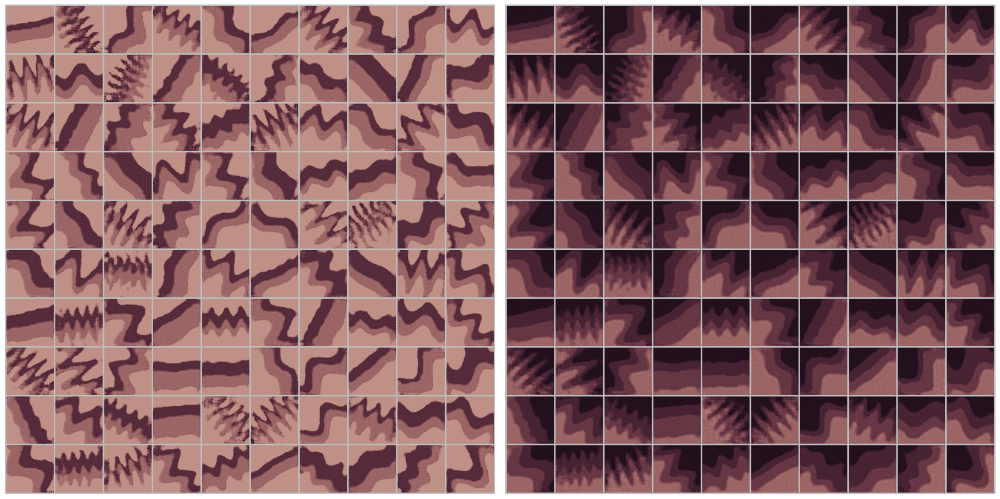

In [62]:
# number of models to display
n_models = 100
# size of the input noise
n_w = 100
# prior centered-reduce Gaussian random noise
noise_np = np.random.default_rng(2025).normal(0, 1, size=(n_models, n_w, 1, 1))
noise = torch.Tensor(noise_np)

# This is strictly equivalent
# torch.manual_seed(2024)
# noise = torch.randn((n_models, nz, 1, 1), device=device)

# The noise is now tracking the gradient
noise.requires_grad_(True)

# with torch.no_grad():  # no grad = no gradient tracking
models = netG(noise)

print(models.shape)
plot_batch_continuous(models)

- Generate conditioned models

torch.Size([100, 2, 64, 64])


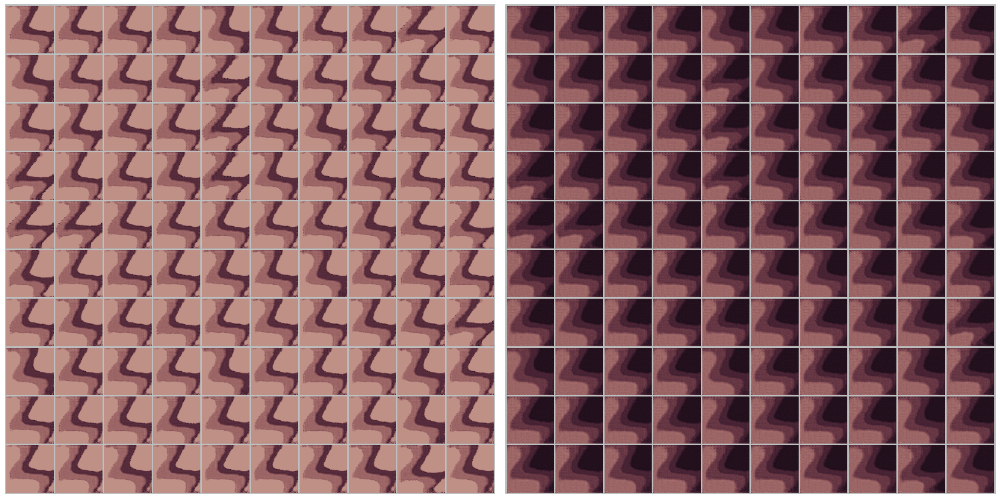

In [63]:
# prior centered-reduce Gaussian random noise
if is_use_conditioner:
    noise_np2 = np.random.default_rng(3488).normal(0, 1, size=(n_models, n_w))
    noise2 = torch.Tensor(noise_np2)

    # This is strictly equivalent
    # torch.manual_seed(2024)
    # noise = torch.randn((n_models, nz, 1, 1), device=device)

    # The noise is now tracking the gradient
    noise2.requires_grad_(True)

    with torch.no_grad():
        noise_cond = net_conditioner(noise2)
        models_cond = netG(noise_cond.unsqueeze(-1).unsqueeze(-1))

        print(models_cond.shape)
        plot_batch_continuous(models_cond)

- Pour backward

In [64]:
models.shape

torch.Size([100, 2, 64, 64])

In [65]:
noise.shape

torch.Size([100, 100, 1, 1])

In [66]:
# Attention, le gradient doit avoir le même input que le modèle en entrée
model_ppm, model_porosity = models[:, 0], models[:, 1]
model_ppm.shape

torch.Size([100, 64, 64])

In [67]:
# avoid gradient accumulaiton in Node
# normally this is not necessary if the noise has been created from numpy
noise.grad = None
random_grad = torch.randn_like(model_ppm)
random_grad.shape

torch.Size([100, 64, 64])

In [68]:
model_ppm.backward(random_grad)
noise.grad.shape

torch.Size([100, 100, 1, 1])

In [69]:
model_ppm.shape

torch.Size([100, 64, 64])

- TODO: plot avec facies

In [70]:
# Grid: the dimensions are imposed by the GANs

nx, ny = models[0, 0].shape
nz = 1
dx = 5.0  # voxel dimension along the x axis
dy = 5.0  # voxel dimension along the y axis
dz = 5.0

# Timesteps
duration_in_seconds = duration_in_days * 3600 * 24
duration_in_seconds_inv = duration_in_days_inv * 3600 * 24
dt_init = 3600 * 6  # timestep in seconds
dt_min = dt_init / 2
dt_max = dt_init * 2
courant_factor = 10

# Hydro parameters
flow_regime = "transient"
diffusion_coef = 1e-10  # general initial diffusion coefficient [m2/s]
permeability = 1e-4  # general permeability
porosity = 0.23  # general porosity [fraction]
storage_coefficient = 1e-3

# Chemistry parameters
c0 = 1.0e-10  # general initial concentration [molal]
c_inj = 1.0  # molal
stocoef = 100

M0 = 0.001  # mineral grade [mol/kg] -> kg of water
kv = -1e-7  # kinetic rate,       [mol/m2/s]
moleweight = 270.0  # molar weight [g/mol]
surface = 500  # cm2/g
As = moleweight * surface / 1e4  # specific area [m2/mol]
logK = 3.2
Ks = 1.0 / pow(10, logK)  # solubility constant [no unit]

- Creation of a network of injectors and producers in shape of hexagons.

In [71]:
# locations in the grid
# selection = index of cells to select. Cells are sorted by y, and if that's equal by x (increasing order).
cell_radius = 40.0
inj_grid_coordinates, prod_grid_coordinates, polygons = gen_wells_coordinates(
    -5.0,
    85.0,
    175.0,
    235.0,
    radius=cell_radius,
    rotation=-30,
    selection=[0, 1, 2, 4, 5, 6, 7],
)

- Get the indices in the grid

In [72]:
prod_grid_indices = np.array(
    [
        np.array(prod_grid_coordinates).T[0] // dx,
        np.array(prod_grid_coordinates).T[1] // dy,
    ],
    dtype=np.int32,
).T

inj_grid_indices = np.array(
    [
        np.array(inj_grid_coordinates).T[0] // dx,
        np.array(inj_grid_coordinates).T[1] // dy,
    ],
    dtype=np.int32,
).T

In [73]:
plotter_wf = ngp.NestedGridPlotter(fig_params={"figsize": (5, 5)})

for i, j in inj_grid_coordinates:
    plotter_wf.ax_dict["ax1-1"].plot(i, j, "ko")

for i, j in prod_grid_coordinates:
    plotter_wf.ax_dict["ax1-1"].plot(i, j, "ro")

patches = []
for polygon in polygons:
    # Add the polygon to the collection of patches
    xy = np.array(polygon)
    patches.append(Polygon(xy, closed=True, facecolor=None))
    # Plot the number of the polygon
p = PatchCollection(patches, alpha=0.75)
p.set_facecolors("white")
p.set_edgecolors("darkgrey")
p.set_linewidth(0.8)
p.set_linestyle("-")
plotter_wf.ax_dict["ax1-1"].add_collection(p)

for i, prod_coords in enumerate(prod_grid_coordinates):
    plotter_wf.ax_dict["ax1-1"].text(prod_coords[0] - 2, prod_coords[1] + 8, i)

plotter_wf.ax_dict["ax1-1"].set_aspect("equal", adjustable="box")
plotter_wf.ax_dict["ax1-1"].set_xlim(0, nx * dx)
plotter_wf.ax_dict["ax1-1"].set_ylim(0, ny * dy)
plotter_wf.ax_dict["ax1-1"].set_xlabel("X [m]", fontweight="bold")
plotter_wf.ax_dict["ax1-1"].set_ylabel("Y [m]", fontweight="bold")

fname = "7_cells_wellfield"
for format in ["png", "pdf"]:
    plotter_wf.fig.savefig(
        str(fig_save_path.joinpath(f"{fname}.{format}")), format=format
    )
plt.close()

In [74]:
prod_grid_coordinates[0]

(165.85680518387326, 80.0480947161671)

- Make some selection

In [75]:
mpl_polygons = []
shapely_polygons = []

# Iterate the polygons to create matplotlib and shapely polygon instances
for polygon in polygons:
    # Add the polygon to the collection of patches
    xy = np.array(polygon)
    mpl_polygons.append(Polygon(xy, closed=True, facecolor=None))
    shapely_polygons.append(ShapelyPolygon(xy))

# Generate well field polygons
full_box = ShapelyBox(0.0, 0.0, nx * dx, ny * dy)  # polygon covering all the grid
inner_area = cascaded_union(shapely_polygons)  # polygon covering the well-field area
buffered_inner_area = inner_area.buffer(10.0)  # add a 10 m buffer around the
buffered_external_area = full_box.difference(
    buffered_inner_area
)  # ouside well-field area

- Create the flowrates for the wells: 12 m3/h decreasing following an exponential... for the producers with a balanced injection (2 m3/h per associated cell for the injectors).

In [76]:
def gen_flowrates(amplitude: float, coef: float, nt: int, dt: float) -> NDArrayFloat:
    """Generate flowrates with a given amplitude and decrease coefficient.

    Parameters
    ----------
    amplitude : float
        Amplitude in m3/h.
    coef : float
        Decrease coefficient.
    nt : int
        Number of timesteps
    dt : float
        Timesteps.

    Returns
    -------
    np.ndarray
        The flowrates.
    """
    return amplitude * np.exp(coef * np.arange(nt) * dt)

- Generate a flowrates with an initial amplitude at 1 m3/h and plot it
- For now steady state

In [77]:
init_prod_flowrates = 8.0  # m3/s
flowrates = init_prod_flowrates * gen_flowrates(
    1.0, -0.0015, duration_in_days + 1, dt=1.0
)  # m3/h
time_in_days = np.arange(duration_in_days + 1)
# plt.plot(np.arange(nt + 1) * dt / 3600 / 24, flowrates)
# plt.ylim(0.0, init_prod_flowrates * 1.1)

plt.plot(np.arange(duration_in_days + 1), flowrates)
plt.ylim(0.0, init_prod_flowrates * 1.1)
if language == Lg.FRENCH:
    plt.ylabel("flowrates [m3/h]", fontweight="bold")
    plt.xlabel("time [d]", fontweight="bold")
else:
    plt.ylabel("débit [m3/h]", fontweight="bold")
    plt.xlabel("temps [j]", fontweight="bold")

fname = "flowrates_decrease"
for format in ["png", "pdf"]:
    plt.savefig(str(fig_save_path.joinpath(f"{fname}.{format}")), format=format)
plt.close()

- Injected reageant varying over time

In [78]:
conv_h2so4_conc: float = 98.078


def conc_h2so4_molpl_to_gpl(x: Union[NDArrayFloat, float]) -> NDArrayFloat:
    return np.array(x * conv_h2so4_conc)


def conc_h2so4_gpl_to_molpl(x: Union[NDArrayFloat, float]) -> NDArrayFloat:
    return np.array(x / conv_h2so4_conc)


init_prod_flowrates = 8.0  # m3/s
_inj_conc = np.zeros(duration_in_days + 1)
_inj_conc[0:40] = conc_h2so4_gpl_to_molpl(30.0)  # 20 g/l
_inj_conc[40:60] = conc_h2so4_gpl_to_molpl(10.0)  # 10 g/l
_inj_conc[60:100] = conc_h2so4_gpl_to_molpl(6.0)  # 6 g/l
# _inj_conc[70:80] = conc_h2so4_gpl_to_molpl(20.0)  # 6 g/l
# _inj_conc[80:100] = conc_h2so4_gpl_to_molpl(0.0)  # 6 g/l
_inj_conc[100:120] = conc_h2so4_gpl_to_molpl(20.0)  # 20 g/l
_inj_conc[120:160] = conc_h2so4_gpl_to_molpl(5.0)  # 6 g/l
_inj_conc[180:200] = conc_h2so4_gpl_to_molpl(15.0)  # 6 g/l
_inj_conc[200:] = conc_h2so4_gpl_to_molpl(6.0)  # 4 g/l

time_in_days = np.arange(duration_in_days + 1)
# plt.plot(np.arange(nt + 1) * dt / 3600 / 24, flowrates)
plt.ylim(0.0, np.max(conc_h2so4_molpl_to_gpl(_inj_conc)) * 1.1)

plt.plot(np.arange(duration_in_days + 1), conc_h2so4_molpl_to_gpl(_inj_conc))
# plt.ylim(0.0, init_prod_flowrates * 1.1)
if language == Lg.FRENCH:
    plt.ylabel("Injected acid conc [g/l]", fontweight="bold")
    plt.xlabel("time [d]", fontweight="bold")
else:
    plt.ylabel("Concentration en acide [g/l]", fontweight="bold")
    plt.xlabel("temps [j]", fontweight="bold")

fname = "acid_conc"
for format in ["png", "pdf"]:
    plt.savefig(str(fig_save_path.joinpath(f"{fname}.{format}")), format=format)
plt.close()

### Mineral grade: reference vs estimated

The mineral grades are defined in [mol/kg]. We calculate the conversion factor to obtain ppm and perform easier mass balances.

ConvU: parameter for converting the mineral content in [mol/kg] to metal grade in [ppm]. Note that the ConvU parameter is specific to the Uranium carrier phase: here Uraninite.

$C_{Uraninite}[\frac{mol}{kg}] = convU \times T_{Uranium}[ppm]$


and


$conv_u = \frac{1.023 \times density_{rock}}{238*porosity_{rock} \times 1000}$

Note the 1.023 is the conversion factor from molar mass to molal mass in CHESS.

In [79]:
rock_density = 1.63
conv_u_grade: NDArrayFloat = np.array(
    [1.023 * rock_density / (238.0 * porosity * 1000)]
)

- Conversion factor for uranium from mol/l to mg/l

In [80]:
conv_u_conc: float = (270.03 - 0.0016 * 2) * 1e3

- Functions to perform the conversions

In [81]:
def grade_ppm_to_mol_per_kg(x: Union[NDArrayFloat, float]) -> NDArrayFloat:
    return x * conv_u_grade


def grade_mol_per_kg_to_ppm(x: Union[NDArrayFloat, float]) -> NDArrayFloat:
    return x / conv_u_grade


def grade_mol_per_kg_to_ppm_1st_derivative(
    x: Union[NDArrayFloat, float]
) -> NDArrayFloat:
    return 1 / conv_u_grade


def conc_molpl_to_mgpl(x: Union[NDArrayFloat, float]) -> NDArrayFloat:
    return np.array(x * conv_u_conc)

In [82]:
conc_h2so4_molpl_to_gpl(2e-1)

array(19.6156)

- Selection of the initial grade among the realizations

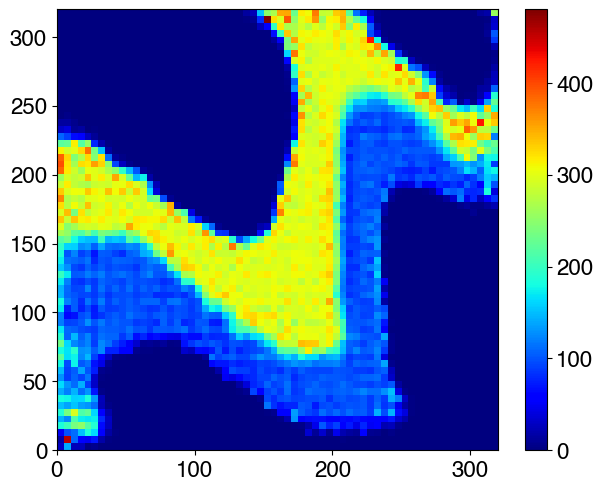

In [83]:
selected_model_id = 40
reference_grades_ppm = model_ppm[selected_model_id].detach().numpy() * 1000.0
plt.imshow(
    reference_grades_ppm.T,
    extent=[0.0, nx * dx, 0.0, ny * dy],
    cmap="jet",
    origin="lower",
)
plt.colorbar()

- Guess facies based on grade

In [84]:
class LithoCodes(Enum):
    OXIDIZED = auto()
    MINERALIZED_POOR = auto()
    MINERALIZED_RICH = auto()
    REDUCED = auto()
    CLAY = auto()


# Array with facies ids (between 0 and 3 matching LithoCodes)
facies_ids = np.zeros((nx, ny))

# Initially, place all as oxidized
facies_ids[:, :] = LithoCodes.OXIDIZED.value

# Add the reduced manually
facies_ids[:40, 20:] = LithoCodes.REDUCED.value
facies_ids[40:, 50:] = LithoCodes.REDUCED.value

# Start with low values
facies_ids[reference_grades_ppm > 1.0] = LithoCodes.MINERALIZED_POOR.value

# Add Rich values
facies_ids[reference_grades_ppm > 200.0] = LithoCodes.MINERALIZED_RICH.value

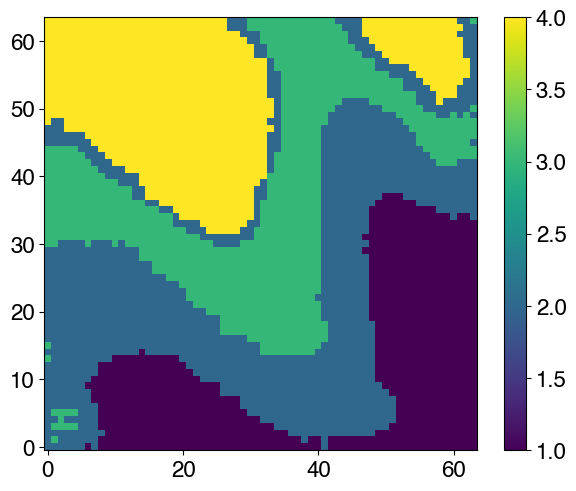

In [85]:
plt.imshow(facies_ids.T, origin="lower")
plt.colorbar()

- Plot the initial model

Text(0.02, 0.5, 'Y [m]')

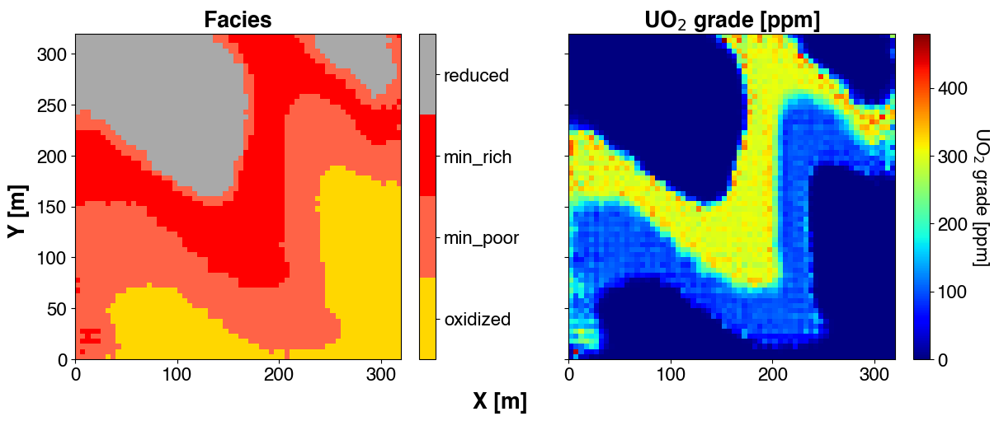

In [86]:
plotter = ngp.NestedGridPlotter(
    fig_params={"constrained_layout": True, "figsize": (12, 5)},
    subplots_mosaic_params={
        "fig0": dict(mosaic=[["ax1-1", "ax2-1"]], sharey=True, sharex=True)
    },
)

# 1) Plot facies
cmap_4f = ListedColormap(["gold", "tomato", "r", "darkgrey"])  # "forestgreen"
target_names_4f = ["oxidized", "min_poor", "min_rich", "reduced"]  # "clay"

ax = plotter.ax_dict["ax1-1"]
# Set the vmin/vmax so that labels are centered on each block
psm = ax.imshow(
    facies_ids.T - 1.5,
    cmap=cmap_4f,
    rasterized=True,
    vmin=-0.5,
    vmax=len(target_names_4f) - 0.5,
    extent=[0.0, nx * dx, 0.0, ny * dy],
    origin="lower",
    aspect="equal",
)
# This function formatter will replace integers with target names
formatter = plt.FuncFormatter(lambda val, loc: target_names_4f[val])
# We must be sure to specify the ticks matching our target names
plt.colorbar(
    psm, ticks=[_v for _v in range(len(target_names_4f))], ax=ax, format=formatter
)
# Add a title
ax.set_title("Facies", fontweight="bold")


# 2) Plot grades
ngp.multi_imshow(
    axes=[plotter.ax_dict["ax2-1"]],
    fig=plotter.fig,
    data={
        "UO$_2$ grade [ppm]": reference_grades_ppm,
    },
    imshow_kwargs={
        "cmap": "jet",
        "extent": [0.0, nx * dx, 0.0, ny * dy],
        "aspect": "equal",
    },
    cbar_title="UO$_2$ grade [ppm]",
)

plotter.fig.supxlabel("X [m]", fontweight="bold")
plotter.fig.supylabel("Y [m]", fontweight="bold")

- Create a new GAN preconditioner

In [87]:
from pyrtid.inverse.preconditioner import (
    Preconditioner,
    get_theta_init_uniform,
    gd_parametrize,
    get_gd_weights,
    d_gd_parametrize_mat_vec,
)
from scipy._lib._util import check_random_state  # To handle random_state


class GDGAN(Preconditioner):
    """
    Apply a Gradual Deformation parametrization associated with a GAN.

    It relies on pytorch.

    The Gradual Deformation parametrization is used to generate a white noise
    reduced and centered as a linear combinaison of Ne white noises while adjusting
    Ne-1 parameters. The obtained white noise is used in the SPDE approach to
    generate a field with the required geostatistical parameters.

    Here: non conditional-simulation.

    TODO: add ref.
    """

    def __init__(
        self,
        ne: int,
        weights_path: Union[Path, str],
        input_noise_size: int,
        param_rank: int = 0,
        theta: Optional[NDArrayFloat] = None,
        conditioner: Optional[ISGenerator] = None,
        random_state: Optional[
            Union[int, np.random.Generator, np.random.RandomState]
        ] = None,
    ) -> None:
        """
        Initialize the instance.

        Parameters
        ----------
        random_state : Optional[Union[int, np.random.Generator, np.random.RandomState]]
            Pseudorandom number generator state used to generate resamples.
            If `random_state` is ``None`` (or `np.random`), the
            `numpy.random.RandomState` singleton is used.
            If `random_state` is an int, a new ``RandomState`` instance is used,
            seeded with `random_state`.
            If `random_state` is already a ``Generator`` or ``RandomState``
            instance then that instance is used. The default is None
        """
        # initialize the super instance
        super().__init__()

        # Loading the weights
        self.gan = torch.load(weights_path, map_location=device)
        # Stop training the GAN
        self.gan.eval()

        # If several parameters are predictied by the gan
        self.param_rank = param_rank

        # initialize the ensemble of white noises with shape (Ns, Ne)
        self.W: NDArrayFloat = check_random_state(random_state).normal(
            size=(input_noise_size, ne)
        )

        # Conditioner for the white noise
        self.conditioner = conditioner

        if theta is not None:
            # check the length correctness
            assert np.size(theta) == ne - 1
            _theta: NDArrayFloat = theta
        else:
            # initialize theta such as weights (ai) are all equals (1/sqrt(Ne)).
            _theta = get_theta_init_uniform(ne)
        self.theta = _theta

    def _get_test_data(
        self,
        lbounds: Union[float, NDArrayFloat],
        ubounds: Union[float, NDArrayFloat],
        shape: Optional[Union[int, Sequence[int]]] = None,
    ) -> NDArrayFloat:
        """
        Get test data to check the preconditioner correctness.

        This is a development tool.
        """
        return self.backtransform(self.theta)

    def _transform(self, s_raw: NDArrayFloat) -> NDArrayFloat:
        """
        Apply the preconditioning/parametrization.

        It works a bit differently for this preconditioner -> the value is not taken
        from the model.

        Parameters
        ----------
        s_raw : NDArrayFloat
            Non-conditioned (transformed) parameter values.

        Returns
        -------
        NDArrayFloat
            Conditioned (transformed) parameter values.
        """
        return self.theta

    def _backtransform(self, s_cond: NDArrayFloat) -> NDArrayFloat:
        """
        Apply the back-preconditioning/parametrization.

        Parameters
        ----------
        s_cond : NDArrayFloat
            Conditioned (transformed) parameter values.

        Returns
        -------
        NDArrayFloat
            Non-conditioned (transformed) parameter values.
        """
        # assign the updated values
        self.theta = s_cond
        # prior white noise = tensor
        # shape of w
        # (nM, nw, 1, 1) -> here nM always 1
        shape = (1, -1, 1, 1)
        if self.conditioner is not None:
            shape = (1, -1)
        self.w = torch.Tensor(
            gd_parametrize(self.W, get_gd_weights(self.theta)).reshape(*shape)
        )
        # The noise is now tracking the gradient
        self.w.requires_grad_(True)
        # sub sample the model
        # shape of models (self.gan(self.w))
        # (nM, nvar, nx, ny)
        # so self.model is (nM, nx, ny)
        if self.conditioner is not None:
            self.model = self.gan(self.conditioner(self.w).unsqueeze(-1).unsqueeze(-1))[
                :, self.param_rank
            ]
        else:
            self.model = self.gan(self.w)[:, self.param_rank]

        # convert to numpy and flatten with size (nx * ny,)
        return self.model.detach().numpy()[0].ravel("F")

    def _dtransform_vec(
        self, s_raw: NDArrayFloat, gradient: NDArrayFloat
    ) -> NDArrayFloat:
        """
        Return the transform 1st derivative times a vector.
        """
        return np.zeros_like(s_raw)

    def _dbacktransform_vec(
        self, s_cond: NDArrayFloat, gradient: NDArrayFloat
    ) -> NDArrayFloat:
        """
        Return the backtransform 1st derivative times a vector.
        """
        # avoid gradient accumulaiton in Node
        # normally this is not necessary if the noise has been created from numpy
        self.w.grad = None

        # shape of gradient must be  (nM, nx, ny)-> same as self.model
        self.model.backward(
            torch.Tensor(gradient.reshape(*self.model.shape, order="F"))
        )
        if self.conditioner is not None:
            return d_gd_parametrize_mat_vec(
                self.W, self.theta, self.w.grad[0, :].detach().numpy()
            )
        return d_gd_parametrize_mat_vec(
            self.W, self.theta, self.w.grad[0, :, 0, 0].detach().numpy()
        )

    def _dbacktransform_inv_vec(
        self, s_cond: NDArrayFloat, gradient: NDArrayFloat
    ) -> NDArrayFloat:
        """
        Return the inverse of the backtransform 1st derivative times a vector.
        """
        raise NotImplementedError(
            "_dbacktransform_inv_vec is not implemented for "
            "GDPNCS! Contact developers for detail!"
        )

    def transform_bounds(self, bounds: NDArrayFloat) -> NDArrayFloat:
        """
        Transform the bounds to match the preconditioned values.

        Parameters
        ----------
        bounds : NDArrayFloat
            Array of shape (N_s, 2).

        Returns
        -------
        NDArrayFloat
            Array of shape (N_s, 2) with transformed bounds.
        """
        bounds = np.zeros((self.theta.size, 2))
        bounds[:, 0] = -np.inf
        bounds[:, 1] = np.inf
        return bounds

- Place sampling points

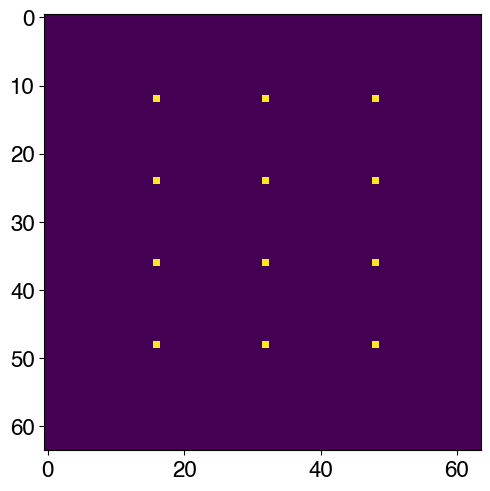

In [88]:
_ix = np.array([int(nx / 4), 2 * int(nx / 4), 3 * int(nx / 4)])
_iy = np.array([int(ny / 5), 2 * int(ny / 5), 3 * int(ny / 5), 4 * int(ny / 5)])
dat_coords = np.array(np.meshgrid(_ix, _iy)).reshape(2, -1)
# Get the node numbers
dat_nn: NDArrayInt = indices_to_node_number(dat_coords[0, :], nx, dat_coords[1, :])
dat_val = reference_grades_ppm.ravel("F")[dat_nn]

a = np.zeros((nx) * (ny))
a[dat_nn] = 1
a2 = a.reshape(nx, ny, order="F")

# plot to check the conditionning well placement
plt.imshow(a2.T, aspect="equal")

In [89]:
dat_nn

array([ 784,  800,  816, 1552, 1568, 1584, 2320, 2336, 2352, 3088, 3104,
       3120])

- Generate 3 conditional simulations with more or less error on the known data with a varigram which is not exactly correct + one constant field (witness case)

In [90]:
# for now krr = 1.0
krr = np.ones_like(reference_grades_ppm)

# Generate new points with error -> systematic bias 200 ppm + some variance on the mesures
measure_era = dat_val / krr.ravel("F")[dat_nn]
measure_era_noisy = measure_era * (
    1 + np.random.default_rng(2048).normal(scale=0.1, size=dat_val.size)
)

estimated_krr = 1.0
dat_val_wrong = np.abs(measure_era_noisy * estimated_krr)

# Condition with the exact data -> we assume a large noise over the data
dat_var_init = np.ones(dat_val.size) * (50**2)

In [91]:
dat_val_wrong

array([5.07704251e-08, 1.09472690e+02, 7.34726728e+00, 7.40480612e+01,
       3.25957926e+02, 1.84155246e-03, 7.19632401e+00, 2.55373867e+02,
       1.09302118e+01, 6.80933034e-12, 4.04277947e-06, 1.07114452e+02])

In [92]:
np.std(dat_val_wrong - dat_val)

17.94818859570166

In [93]:
np.std(dat_val_wrong - dat_val)

17.94818859570166

## Build a parametrization

- We add a abs operator to make sure that the preconditioning works fine and that the resulting field is positive

In [94]:
ne = 100

gdgan = GDGAN(
    ne=ne,
    weights_path=model_weights_path,
    input_noise_size=100,
    param_rank=0,
    random_state=2027,
    conditioner=net_conditioner if is_use_conditioner else None,
)

# Seems correct
# lbounds = np.ones((nx * ny)) * -1000
# ubounds = np.ones((nx * ny)) * 1500
# gdgan._test_preconditioner(lbounds, ubounds)

# We apply three successive preconditionning:
# 1) A first one to convert mol/kg to ppm / 1000.0
# 2) A second one to ensure positive values when backconditioning
# 3) A third one to convert ppm to white noise linear combinaison weights through the
# gradual deformation + SPDE approach
pcd = dminv.ChainedTransforms(
    [
        # dminv.LinearTransform(slope=1.0 / conv_u_grade / 1000, y_intercept=0.0),
        # dminv.InvAbsTransform(),
        gdgan,
    ]
)

# check the gradient -> we cannot test on pcd for now because the test data is not correctly implemented for chained transform
gdgan._test_preconditioner(np.full(ne - 1, 0.0), np.full(ne - 1, 0.01))

estimate_grade_simu_ppm = grade_mol_per_kg_to_ppm(
    pcd.backtransform(gdgan.theta).reshape(nx, ny, order="F")
)
plt.imshow(estimate_grade_simu_ppm.T, origin="lower")
plt.colorbar()

AssertionError: 
Not equal to tolerance rtol=1e-05, atol=0

Mismatched elements: 99 / 99 (100%)
Max absolute difference: 0.21125258
Max relative difference: 0.12718459
 x: array([-0.155873, -0.225017,  0.006074,  0.373876, -0.092315, -0.215287,
        0.993123, -0.195669, -0.624628, -0.165106,  0.023435,  0.124474,
       -0.687924, -0.02534 , -0.39023 , -0.326826,  0.311748, -0.171428,...
 y: array([-0.156148, -0.228026,  0.005971,  0.374685, -0.092437, -0.216636,
        0.99427 , -0.192946, -0.62418 , -0.163433,  0.023275,  0.12311 ,
       -0.686628, -0.025075, -0.390538, -0.325494,  0.314389, -0.172397,...

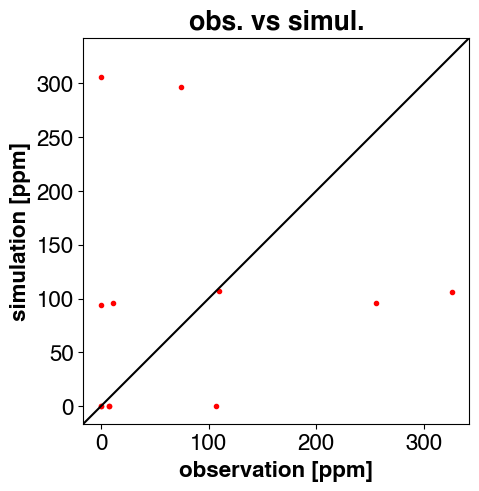

In [ ]:
dat_val_simu = estimate_grade_simu_ppm.ravel("F")[dat_nn]

plotter = ngp.NestedGridPlotter()
pyrtid.plot.plot_observed_vs_simulated(
    plotter.axes[0],
    obs_vector=dat_val_wrong,
    pred_vector_initial=dat_val_simu,
    units="ppm",
)

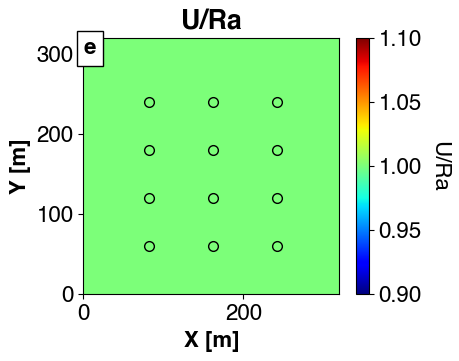

In [ ]:
plotter = ngp.NestedGridPlotter(
    fig_params={"constrained_layout": True, "figsize": (4.5, 3.5)},
    subplots_mosaic_params={"fig0": dict(mosaic=[["ax1-1"]], sharey=True, sharex=True)},
)

ngp.multi_imshow(
    axes=plotter.axes[:1],
    fig=plotter.fig,
    data={
        "U/Ra": krr,
    },
    cbar_title="U/Ra",
    imshow_kwargs={
        "cmap": plt.get_cmap("jet"),
        "extent": [0.0, nx * dx, 0.0, ny * dy],
        "aspect": "equal",
    },
    xlabel="X [m]",
    ylabel="Y [m]",
)

for ax in plotter.axes:
    # plot the sampling points here
    ax.plot(
        (dat_coords[0] + 0.5) * dx,
        (dat_coords[1] * dy),
        linestyle="None",
        marker="o",
        markersize=7,
        color="k",
        markerfacecolor="None",
    )

ngp.add_letter_to_frames(plotter.axes)

# fontsize= 16
# bbox = dict(facecolor='pink', alpha=0.2, edgecolor='red', boxstyle='square,pad=0.5')
# ax.annotate(letter, xy=(0.0, 0.0),  xytext=(0,0.5*16), color='k', va="top", ha="left", fontweight="normal", textcoords="offset points",
#         bbox=bbox)
fname = "krr"
for format in ["png", "pdf"]:
    plotter.savefig((fig_save_path.joinpath(f"{fname}.{format}")), format=format)

In [ ]:
grade_ppm_to_mol_per_kg(1)

array([3.04620022e-05])

- Plot the reserves per mesh

In [ ]:
def get_cell_reserves(
    u_field_grades: NDArrayFloat,
    cell_polygons: Sequence[Sequence[Tuple[float, float]]],
    nx: int,
    ny: int,
    dx: float,
    dy: float,
    dz: float,
) -> Sequence[float]:
    """Return the reserves in ton under the given technological cell.

    Parameters
    ----------
    u_field_grades : NDArrayFloat
        Uraninite grades field in ppm. 2D Array.
    dx : float
        X dimension of one mesh [m].
    dy : float
        Y dimension of one mesh [m].
    dz : float
        Z dimension of one mesh [m].
    mask: NDArrayFloat
        Mask to apply before doing the selection.
    Returns
    -------
    float
        The associated uranium reserves in t.
    """
    # flatten points coordinates
    _x, _y, _z = node_number_to_indices(np.arange(nx * ny), nx, ny)
    _x = _x * dx + dx / 2
    _y = _y * dy + dy / 2
    grid_coords = np.array((_x, _y)).T

    cell_volume = dx * dy * dz  # m3
    # Conversion factor to go from a number of ppm per unit of volume to a mass in t (all cells are the same)
    conv_factor = cell_volume * rock_density * 1e-6

    reserves_list = []

    mask_sum = None
    for cell_polygon in cell_polygons:
        # Select the mesh that belongs to the polygon
        path = mpl.path.Path(cell_polygon)
        mask = path.contains_points(grid_coords)
        if mask_sum is not None:
            mask = np.logical_and(mask, ~mask_sum)
            mask_sum = np.logical_or(mask, mask_sum)
        else:
            mask_sum = mask
        reserves_list.append(float(u_field_grades[mask].sum() * conv_factor))
    return reserves_list

- Compute the reserve associated to the cells in t
- Need to transpose for the display

In [ ]:
reference_reserves_t = get_cell_reserves(
    reference_grades_ppm.T.ravel(), polygons, nx, ny, dx, dy, dz
)
estimated_reserves_simu_t = get_cell_reserves(
    estimate_grade_simu_ppm.T.ravel(), polygons, nx, ny, dx, dy, dz
)

- Compute deviations

In [ ]:
initial_u_dev_simu = np.sum(estimated_reserves_simu_t) - np.sum(reference_reserves_t)
initial_u_dev_simu_frac = initial_u_dev_simu / np.sum(reference_reserves_t)

logging.info(
    f"initial_U_dev_simu = {initial_u_dev_simu:.2f} t ({initial_u_dev_simu_frac * 100:.2f}%)"
)

INFO:root:initial_U_dev_simu = 3.14 t (7.24%)


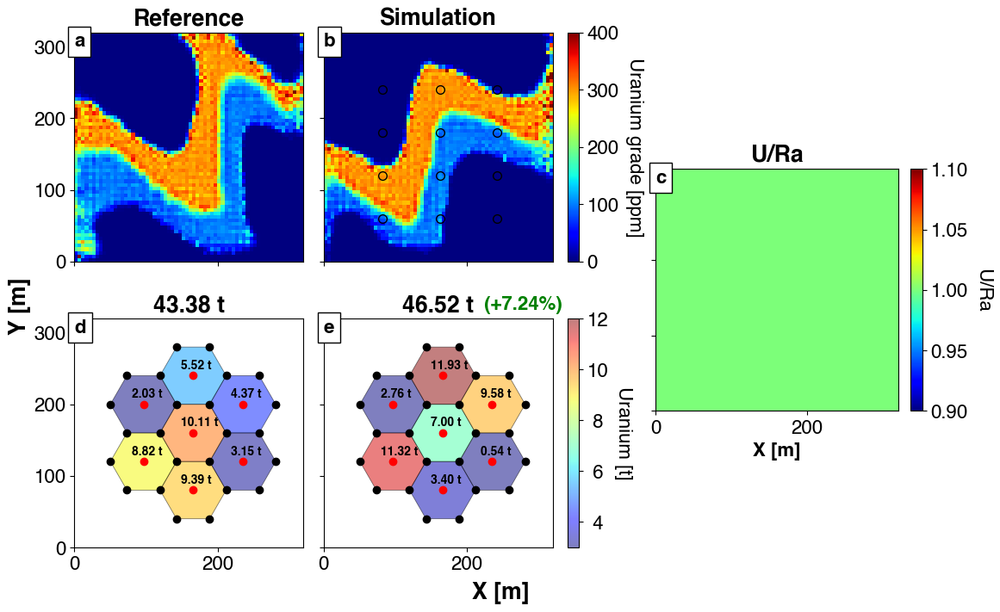

In [ ]:
plotter = ngp.NestedGridPlotter(
    fig_params={"constrained_layout": True, "figsize": (11.5, 7)},
    subplots_mosaic_params={
        "fig0": dict(
            mosaic=[["ax1-1", "ax2-1", "ax3-1"], ["ax1-2", "ax2-2", "ax3-1"]],
            sharey=True,
            sharex=True,
        ),
    },
)

# 1) Plot the grades
if language == Lg.ENGLISH:
    labels = ["Reference", "Simulation"]
    cbar_title = "Uranium grade [ppm]"
else:
    labels = ["Réference", "Simulation"]
    cbar_title = "Teneur en uranium [ppm]"

cbar_up = ngp.multi_imshow(
    axes=plotter.axes[:2],
    fig=plotter.fig,
    data={
        labels[0]: reference_grades_ppm,
        labels[1]: estimate_grade_simu_ppm,
    },
    cbar_title=cbar_title,
    imshow_kwargs={
        "cmap": plt.get_cmap("jet"),
        "extent": [0.0, nx * dx, 0.0, ny * dy],
        "vmin": 0.0,
        "vmax": 400.0,
        "aspect": "equal",
    },
    cbar_kwargs={"pad": 0.01},
)

# plot the sampling points here
plotter.axes[1].plot(
    (dat_coords[0] + 0.5) * dx,
    (dat_coords[1] * dy),
    linestyle="None",
    marker="o",
    markersize=7,
    color="k",
    markerfacecolor="None",
)

# 2) Plot the reserves
for _n, (ax, reserves) in enumerate(
    zip(
        [plotter.axes[3], plotter.axes[-1]],
        (
            reference_reserves_t,
            estimated_reserves_simu_t,
        ),
    )
):
    for i, j in inj_grid_coordinates:
        ax.plot(i, j, "ko")

    for i, j in prod_grid_coordinates:
        ax.plot(i, j, "ro")

    patches = []
    for i, cell_polygon in enumerate(polygons):
        # Add the polygon to the collection of patches
        xy = np.array(cell_polygon)
        patches.append(Polygon(xy, closed=True, facecolor=None))

        centroid = (xy.mean(axis=0)[0] - 10, xy.mean(axis=0)[1] + 10)

        ax.text(*centroid, f"{reserves[i]:.2f} t", fontsize=10, fontweight="bold")

        # Plot the number of the polygon
    p = PatchCollection(patches, alpha=0.5, cmap=plt.get_cmap("jet"))
    # p.set_facecolors("white")
    p.set_edgecolors("black")
    p.set_linewidth(0.6)
    p.set_linestyle("-")
    p.set_array(np.array(reserves, dtype=float))
    p.set_clim(3, 12)
    ax.add_collection(p)

    # Add the tonnages
    tmp = ax.set_title(f"{np.sum(reserves):.2f} t", fontweight="bold")

    if _n != 0:
        # Absolute deviation
        ton_diff_abs = np.sum(reserves) - np.sum(reference_reserves_t)
        # Relative deviation
        ton_diff_rel = ton_diff_abs / np.sum(reference_reserves_t)

        pos = tmp.get_position()
        txt = ax.text(
            pos[0] + 0.2,
            pos[1] + 0.04,
            f"({ton_diff_rel * 100:+.2f}%)",
            fontweight="bold",
            transform=ax.transAxes,
            color="r" if np.abs(ton_diff_rel) > 0.1 else "g",
        )
        # txt.set_bbox(tmp.get_bbox_patch().get_boxstyle())

# Add a common colorbar
cbar = plotter.fig.colorbar(
    p,
    ax=[plotter.axes[3], plotter.axes[-1]],
    orientation="vertical",
    fraction=0.1,
    format="%2.f",
    pad=0.01,
)
cbar.ax.get_yaxis().labelpad = 20
cbar.ax.set_ylabel("Uranium [t]", rotation=270)

# 3) Plot the U/Ra
cbar = ngp.multi_imshow(
    axes=plotter.axes[2:3],
    fig=plotter.fig,
    data={
        "U/Ra": krr,
    },
    cbar_title="U/Ra",
    imshow_kwargs={
        "cmap": plt.get_cmap("jet"),
        "extent": [0.0, nx * dx, 0.0, ny * dy],
        "aspect": "equal",
    },
    cbar_kwargs={"shrink": 0.47},
    xlabel="X [m]",
    # ylabel="Y [m]",
)

# Box dimensions
for ax in plotter.ax_dict.values():
    ax.set_xlim(0, nx * dx)
    ax.set_ylim(0, ny * dy)
    ax.set_aspect("equal", adjustable="box")

# plotter.fig.suptitle("Grades and tonnages", fontweight="bold", fontsize=22)
plotter.fig.supxlabel("X [m]", fontweight="bold")
plotter.fig.supylabel("Y [m]", fontweight="bold")

ngp.add_letter_to_frames(plotter.axes)

fname = "reserves_+_grades_per_cells_+_URa"
for format in ["png", "pdf"]:
    plotter.savefig((fig_save_path.joinpath(f"{fname}.{format}")), format=format)

## Forward problem in demonstrator

In [ ]:
time_params = dmfwd.TimeParameters(
    duration=duration_in_seconds,
    dt_init=dt_init,
    dt_min=dt_min,
    dt_max=dt_max,
    courant_factor=courant_factor,
)
geometry = dmfwd.Geometry(nx=nx, ny=ny, dx=dx, dy=dx)
fl_params = dmfwd.FlowParameters(
    permeability=permeability,
    storage_coefficient=storage_coefficient,
    regime=dmfwd.FlowRegime.TRANSIENT,
    tolerance=1e-10,
)
tr_params = dmfwd.TransportParameters(
    diffusion=diffusion_coef,
    porosity=porosity,
    crank_nicolson_diffusion=1.0,
    crank_nicolson_advection=0.5,
    tolerance=1e-12,
    fpi_eps=1e-5,
    is_numerical_acceleration=True,
)
gch_params = dmfwd.GeochemicalParameters(
    conc=c0, grade=M0, kv=kv, As=As, Ks=Ks, stocoef=200.0
)

base_model = dmfwd.ForwardModel(geometry, time_params, fl_params, tr_params, gch_params)

- Add source and sink terms

In [ ]:
flw_times_in_s = np.arange(duration_in_days + 1) * 3600 * 24.0
prod_flw = -flowrates / 3600  # m3/h to m3/s
# times = np.arange(stop=nt + 1, start=0) * dt

for count_prod, (ix, iy) in enumerate(prod_grid_indices):
    name = f"producer_{ix}_{iy}"

    sink_term = dmfwd.SourceTerm(
        name,
        node_ids=np.array([indices_to_node_number(ix, nx, iy)]),
        times=flw_times_in_s,
        flowrates=prod_flw,
        concentrations=np.zeros((*prod_flw.shape, 2)),
    )
    base_model.add_src_term(sink_term)

for count_inj, (ix, iy) in enumerate(inj_grid_indices):
    x, y = inj_grid_coordinates[count_inj]
    name = f"injector_{ix}_{iy}"

    nb_prod_well_linked = 0
    # Find the number of producers that the injector is linked with
    for xp, yp in prod_grid_coordinates:
        # we take 20% margin on the cell radius
        if np.sqrt((x - xp) ** 2 + (y - yp) ** 2) < cell_radius * 1.2:
            nb_prod_well_linked += 1

    # NOTE: need to inject a non null quantity to avoid numerical issues
    inj_conc = np.zeros((*prod_flw.shape, 2))
    inj_conc[:, 1] = _inj_conc
    inj_conc[inj_conc < 0] = 1e-10

    source_term = dmfwd.SourceTerm(
        name,
        node_ids=np.array([indices_to_node_number(ix, nx, iy)]),
        times=flw_times_in_s,
        flowrates=-prod_flw
        / 6.0
        * nb_prod_well_linked,  # /6.0 because of hexagonal cells
        concentrations=inj_conc,  # injection concentration
    )
    base_model.add_src_term(source_term)

- Check the hydraulic balance

In [ ]:
total_prod_flow = 0
total_inj_flow = 0

for source_term in base_model.source_terms:
    _dt = np.diff(flw_times_in_s)  # timesteps in s
    total_inj_flow += np.sum(
        np.where(source_term.flowrates > 0, source_term.flowrates, 0.0)[1:] * _dt
    )
    total_prod_flow += np.sum(
        np.where(source_term.flowrates < 0, -source_term.flowrates, 0.0)[1:] * _dt
    )

print(f"total_prod_flow = {total_prod_flow} m3")
print(f"total_inj_flow = {total_inj_flow} m3")

# This test should fail if there is any issue !
assert np.round(total_prod_flow, 4) == np.round(total_inj_flow, 4)

total_prod_flow = 77059.83421304212 m3
total_inj_flow = 77059.83421304215 m3


In [ ]:
source_term.times.size

61

- Add boundary conditions

In [ ]:
# # west
# base_model.add_boundary_conditions(dmfwd.ConstantHead(span=(slice(0, 1), slice(None))))
# # est
# base_model.add_boundary_conditions(
#     dmfwd.ConstantHead(span=(slice(nx - 1, nx), slice(None)))
# )
# # south
# base_model.add_boundary_conditions(dmfwd.ConstantHead(span=(slice(None), slice(0, 1))))
# # north
# base_model.add_boundary_conditions(
#     dmfwd.ConstantHead(span=(slice(None), slice(nx - 1, nx)))
# )

In [ ]:
model_reference = copy.deepcopy(base_model)
model_estimate = copy.deepcopy(base_model)

# Exact initial uranium grade
model_reference.tr_model.set_initial_grade(
    grade_ppm_to_mol_per_kg(reference_grades_ppm)
)
# Estimated initial uranim grade
model_estimate.tr_model.set_initial_grade(
    grade_ppm_to_mol_per_kg(estimate_grade_simu_ppm)
)

- Run the models

In [ ]:
solver_reference = dmfwd.ForwardSolver(model_reference)
solver_reference.solve(is_verbose=False)

KeyboardInterrupt: 

In [ ]:
solver_estimate_simu = dmfwd.ForwardSolver(model_estimate)
solver_estimate_simu.solve(is_verbose=False)

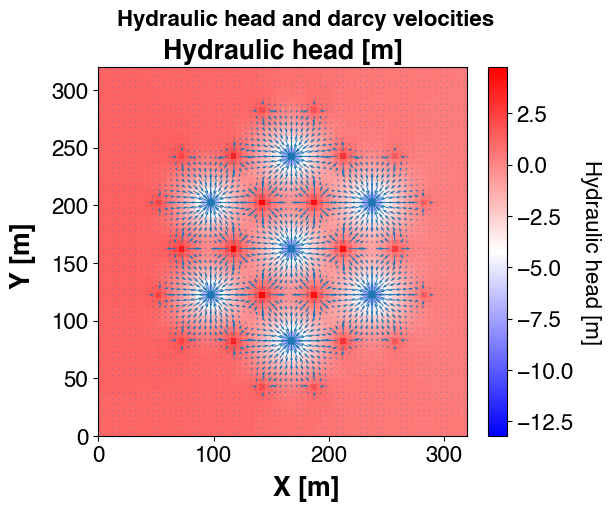

In [ ]:
time_index_1 = 10
time_index_2 = 20

plotter = ngp.NestedGridPlotter(
    fig_params={"constrained_layout": True, "figsize": (6, 5)},
    # subfigs_params={"nrows": 1},
    subplots_mosaic_params={
        "fig0": dict(mosaic=[["ax1-1"]], sharey=True, sharex=True),
    },
)

if language == Lg.ENGLISH:
    label = "Hydraulic head [m]"
else:
    label = "Charges hydrauliques [m]"

ngp.multi_imshow(
    axes=plotter.axes,
    fig=plotter.fig,
    data={
        label: model_estimate.fl_model.head[:, :, time_index_1],
        #         "Head [m] 2": model_estimate.fl_model.head[:, :, time_index_2],
    },
    cbar_title=label,
    imshow_kwargs={"extent": [0.0, nx * dx, 0.0, ny * dy], "aspect": "equal"},
)

for ax, time_index in zip(plotter.axes, [time_index_1, time_index_2]):
    Y, X = np.meshgrid((np.arange(nx) + 0.5) * dx, (np.arange(ny) + 0.5) * dy)
    ax.quiver(
        X,
        Y,
        model_estimate.fl_model.u_darcy_x_center[:, :, time_index],
        model_estimate.fl_model.u_darcy_y_center[:, :, time_index],
        color="C0",
        scale_units="xy",
    )

if language == Lg.ENGLISH:
    title = "Hydraulic head and darcy velocities"
else:
    title = "Charges hydrauliques et vitesses de darcy"
plotter.subfigs["fig0"].suptitle(title, fontweight="bold", fontsize=16)
plotter.subfigs["fig0"].supxlabel("X [m]", fontweight="bold")
plotter.subfigs["fig0"].supylabel("Y [m]", fontweight="bold")

fname = "heads_and_velocities"
for format in ["png", "pdf"]:
    plotter.savefig((fig_save_path.joinpath(f"{fname}.{format}")), format=format)

- Plot the concentration evolution

## Observations and associated uncertainties

- We select only 10% of the data points available to get something more realistic

In [ ]:
freq_measure_in_days = 6  # one measure every four days
n_sampled_days = duration_in_days_inv / freq_measure_in_days

obs_times_in_s = np.arange(n_sampled_days) * 3600 * 24 * freq_measure_in_days
obs_times_in_d = obs_times_in_s / 3600 / 24
obs_times_in_s

array([      0.,  518400., 1036800., 1555200., 2073600., 2592000.,
       3110400., 3628800., 4147200., 4665600.])

In [ ]:
model_estimate.tr_model.conc.shape

(64, 64, 132)

In [ ]:
np.count_nonzero(model_estimate.tr_model.conc2 < 0.0)

6

- Create a function to add some noise to the observations

In [ ]:
noise_std: float = 5e-6  # This is an absolute value


def get_white_noise(shape: Iterable[int]) -> NDArrayFloat:
    """
    Return the input with some added white noise.

    Note
    ----
    The parameters are hardcoded to be consistent in the notebook.
    Change the function directly.
    """
    mean_noise = 0.0  # mean
    return np.random.default_rng(2021).normal(
        mean_noise, noise_std, size=np.array(shape)
    )


# Generate a white noise
obs_noise: NDArrayFloat = get_white_noise((len(prod_grid_indices), obs_times_in_s.size))

- Noise in mg/l

In [ ]:
conc_molpl_to_mgpl(noise_std)

array(1.350134)

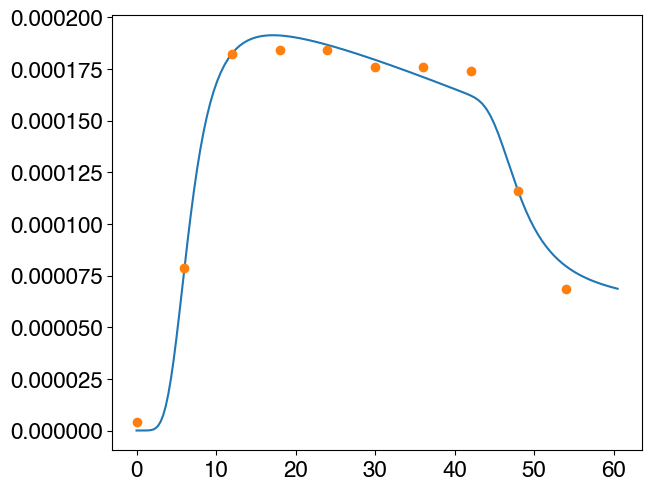

In [ ]:
simu_times_ref_in_s = model_reference.time_params.times
simu_times_ref_in_d = simu_times_ref_in_s / 3600 / 24

simu_times_est_in_s = model_estimate.time_params.times
simu_times_est_in_d = simu_times_est_in_s / 3600 / 24

obs_values = np.zeros((len(prod_grid_indices), obs_times_in_s.size))

for count, (ix, iy) in enumerate(prod_grid_indices):
    # interpolate the values
    obs_values[count] = (
        interp1d(
            simu_times_ref_in_s, model_reference.tr_model.conc[ix, iy, :], kind="cubic"
        )(obs_times_in_s)
        + obs_noise[count, :]
    )

count = 2

ix, iy = prod_grid_indices[count]
plt.plot(simu_times_ref_in_d, model_reference.tr_model.conc[ix, iy, :])
plt.plot(
    obs_times_in_d,
    obs_values[count],
    marker="o",
    linestyle="none",
)

- count the number of observations

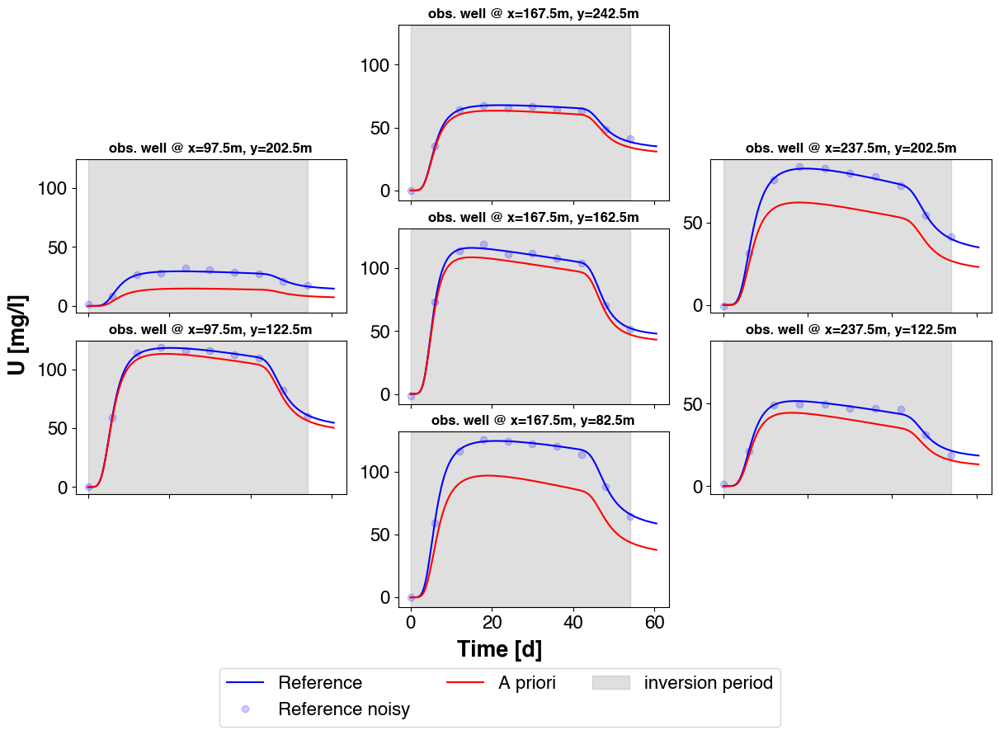

In [ ]:
# Indicate the order in which to plot
obs_plot_locations = ["ax2-3", "ax1-2", "ax3-2", "ax2-2", "ax1-1", "ax3-1", "ax2-1"]

plotter = ngp.NestedGridPlotter(
    fig_params={"constrained_layout": True, "figsize": (12, 8)},
    subfigs_params={
        "ncols": 3  # np.unique(np.array(prod_grid_locations)[:, 0].round()).size,
    },
    subplots_mosaic_params={
        "left_col": dict(
            mosaic=[["ghost1"], ["ax1-1"], ["ax1-2"], ["ghost2"]],
            gridspec_kw=dict(
                height_ratios=[1.0, 1.2, 1.2, 1.0],
            ),
            sharey=True,
            sharex=True,
        ),
        "centered_col": dict(
            mosaic=[["ax2-1"], ["ax2-2"], ["ax2-3"]], sharey=True, sharex=True
        ),
        "right_col": dict(
            mosaic=[["ghost3"], ["ax3-1"], ["ax3-2"], ["ghost4"]],
            gridspec_kw=dict(
                height_ratios=[1.0, 1.2, 1.2, 1.0],
            ),
            sharey=True,
            sharex=True,
        ),
    },
)

# hide axes and borders
plotter.ax_dict["ghost1"].axis("off")
plotter.ax_dict["ghost2"].axis("off")
plotter.ax_dict["ghost3"].axis("off")
plotter.ax_dict["ghost4"].axis("off")

# Static plot
for count, ((ix, iy), ax_name) in enumerate(zip(prod_grid_indices, obs_plot_locations)):
    x = (ix + 0.5) * dx
    y = (iy + 0.5) * dy

    if language == Lg.ENGLISH:
        obs_well_name = f"obs. well @ x={x:.1f}m, y={y:.1f}m"
    else:
        obs_well_name = f"producteur @ x={x:.1f}m, y={y:.1f}m"

    ax = plotter.ax_dict[ax_name]
    ax.set_title(obs_well_name, fontweight="bold", fontsize=12)

    if language == Lg.ENGLISH:
        labels = ["Reference", "Reference noisy", "A priori"]
    else:
        labels = ["Réference", "Réference bruitée", "A priori"]

    data = {
        labels[0]: {
            "x": simu_times_ref_in_d,
            "y": conc_molpl_to_mgpl(model_reference.tr_model.conc[ix, iy, :]),
            "kwargs": {"c": "b", "linestyle": "-"},
        },
        labels[1]: {
            "x": obs_times_in_d,
            "y": conc_molpl_to_mgpl(obs_values[count]),
            "kwargs": {"c": "b", "marker": "o", "linestyle": "None", "alpha": 0.2},
        },
        labels[2]: {
            "x": simu_times_est_in_d,
            "y": conc_molpl_to_mgpl(model_estimate.tr_model.conc[ix, iy, :]),
            "kwargs": {"c": "r", "linestyle": "-"},
        },
    }

    for k, v in data.items():
        ax.plot(v["x"], v["y"], **v["kwargs"], label=k)

    # ax.set_xlabel("Time", fontweight="bold")
    # ax.set_xlabel("T_Cinet [mol/s]", fontweight="bold")

    if language == Lg.ENGLISH:
        ax.axvspan(
            0,
            obs_times_in_d[-1],
            color="grey",
            alpha=0.25,
            label="inversion period",
        )
    else:
        ax.axvspan(
            0,
            obs_times_in_d[-1],
            color="grey",
            alpha=0.25,
            label="Période inversion",
        )

plotter.add_fig_legend(ncol=3)

if language == Lg.ENGLISH:
    plotter.fig.supxlabel("Time [d]", fontweight="bold")
    plotter.fig.supylabel("U [mg/l]", fontweight="bold")
else:
    plotter.fig.supxlabel("Temps [j]", fontweight="bold")
    plotter.fig.supylabel("U [mg/l]", fontweight="bold")

fname = "U_at_producers_before_inv"
for format in ["png", "pdf"]:
    plotter.savefig(str(fig_save_path.joinpath(f"{fname}.{format}")), format=format)

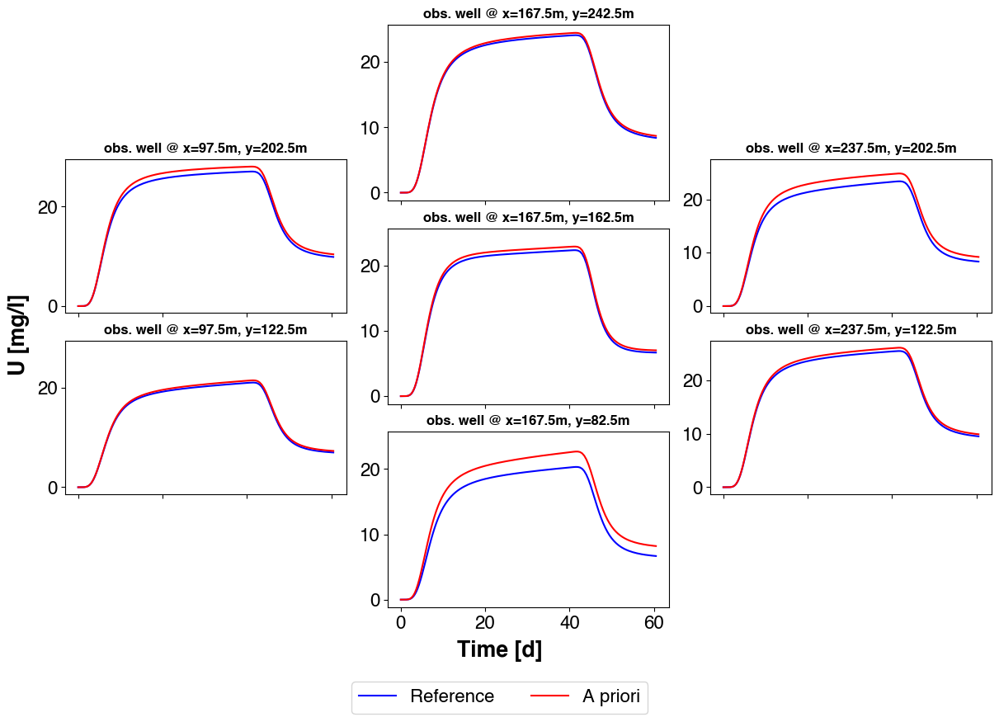

In [ ]:
# Indicate the order in which to plot
obs_plot_locations = ["ax2-3", "ax1-2", "ax3-2", "ax2-2", "ax1-1", "ax3-1", "ax2-1"]

plotter = ngp.NestedGridPlotter(
    fig_params={"constrained_layout": True, "figsize": (12, 8)},
    subfigs_params={
        "ncols": 3  # np.unique(np.array(prod_grid_locations)[:, 0].round()).size,
    },
    subplots_mosaic_params={
        "left_col": dict(
            mosaic=[["ghost1"], ["ax1-1"], ["ax1-2"], ["ghost2"]],
            gridspec_kw=dict(
                height_ratios=[1.0, 1.2, 1.2, 1.0],
            ),
            sharey=True,
            sharex=True,
        ),
        "centered_col": dict(
            mosaic=[["ax2-1"], ["ax2-2"], ["ax2-3"]], sharey=True, sharex=True
        ),
        "right_col": dict(
            mosaic=[["ghost3"], ["ax3-1"], ["ax3-2"], ["ghost4"]],
            gridspec_kw=dict(
                height_ratios=[1.0, 1.2, 1.2, 1.0],
            ),
            sharey=True,
            sharex=True,
        ),
    },
)

# hide axes and borders
plotter.ax_dict["ghost1"].axis("off")
plotter.ax_dict["ghost2"].axis("off")
plotter.ax_dict["ghost3"].axis("off")
plotter.ax_dict["ghost4"].axis("off")

# Static plot
for count, ((ix, iy), ax_name) in enumerate(zip(prod_grid_indices, obs_plot_locations)):
    x = (ix + 0.5) * dx
    y = (iy + 0.5) * dy

    if language == Lg.ENGLISH:
        obs_well_name = f"obs. well @ x={x:.1f}m, y={y:.1f}m"
    else:
        obs_well_name = f"producteur @ x={x:.1f}m, y={y:.1f}m"

    ax = plotter.ax_dict[ax_name]
    ax.set_title(obs_well_name, fontweight="bold", fontsize=12)

    if language == Lg.ENGLISH:
        labels = ["Reference", "Reference noisy", "A priori"]
    else:
        labels = ["Réference", "Réference bruitée", "A priori"]

    data = {
        labels[0]: {
            "x": simu_times_ref_in_d,
            "y": conc_h2so4_molpl_to_gpl(model_reference.tr_model.conc2[ix, iy, :]),
            "kwargs": {"c": "b", "linestyle": "-"},
        },
        # labels[1]: {
        #     "x": obs_times_in_d,
        #     "y": conc_molpl_to_mgpl(obs_values[count]),
        #     "kwargs": {"c": "b", "marker": "o", "linestyle": "None", "alpha": 0.2},
        # },
        labels[2]: {
            "x": simu_times_est_in_d,
            "y": conc_h2so4_molpl_to_gpl(model_estimate.tr_model.conc2[ix, iy, :]),
            "kwargs": {"c": "r", "linestyle": "-"},
        },
    }

    for k, v in data.items():
        ax.plot(v["x"], v["y"], **v["kwargs"], label=k)

    # ax.set_xlabel("Time", fontweight="bold")
    # ax.set_xlabel("T_Cinet [mol/s]", fontweight="bold")

plotter.add_fig_legend(ncol=3)

if language == Lg.ENGLISH:
    plotter.fig.supxlabel("Time [d]", fontweight="bold")
    plotter.fig.supylabel("U [mg/l]", fontweight="bold")
else:
    plotter.fig.supxlabel("Temps [j]", fontweight="bold")
    plotter.fig.supylabel("U [mg/l]", fontweight="bold")

fname = "H2SO4_at_producers_before_inv"
for format in ["png", "pdf"]:
    plotter.savefig(str(fig_save_path.joinpath(f"{fname}.{format}")), format=format)

- Plot the concentrations and grades for the reference

In [ ]:
def get_frame_time_label(
    nb_frames: int, ltimes: List[float]
) -> Generator[str, None, None]:
    """
    Generator of time labels (in d).

    Parameters
    ----------
    nb_frames : int
        Number of frames in the animation.
    ltimes : List[float]
        List of times. The length of the list must be equal or greater than `nb_frames`.
        Times are expected in seconds.

    Yields
    ------
    Generator[str, None, None]
    """
    # subtract -1 to nb_steps and _nb_frames so that when
    # frame_index = 0, we get the first element of ltimes, and when
    # frame_index = _nb_frames - 1, we get the last element of ltimes.
    ts_btw_frames = (len(ltimes) - 1) / (nb_frames - 1)
    for frame in range(nb_frames):
        yield f"time = {ltimes[int(ts_btw_frames * frame)] / 3600 / 24:.1f} d"

In [ ]:
# 1) creation du plotter avec 2 graphiques sur une rangée
plotter = ngp.AnimatedPlotter(
    fig_params={"constrained_layout": True, "figsize": (10, 5)},
    subplots_mosaic_params={
        "fig0": dict(mosaic=[["ax1-1", "ax1-2"]], sharey=True, sharex=True)
    },
)

# 2) ici model_estimate.time_params.nt est le nombre de timesteps, le nombre de frames est donc au max 15.
nb_frames = min(model_estimate.time_params.nt, 15)

# 3) Animation des deux graphiques
# Ici conc_molpl_to_mgpl(model_reference.tr_model.conc) et conc_molpl_to_mgpl(model_estimate.tr_model.conc)
# sont des np.array 3D avec pour dim (nx, ny, nt)
plotter.animated_multi_imshow(
    ax_names=["ax1-1", "ax1-2"],
    fig=plotter.fig,
    data={
        "Reference": conc_molpl_to_mgpl(model_reference.tr_model.conc),
        "Initial guess": conc_molpl_to_mgpl(model_estimate.tr_model.conc),
    },
    cbar_title="UO2[2+] [mg/l]",
    imshow_kwargs={
        "cmap": plt.get_cmap("jet"),
        "extent": [0.0, nx * dx, 0.0, ny * dy],
        "vmin": 0.0,
        "vmax": 400.0,
    },
    xlabel="X (m)",
    ylabel="Y (m)",
    nb_frames=nb_frames,
)

# 4) Ajout d'un titre à la figure
plotter.subfigs["fig0"].suptitle("UO2[2+] [mg/l]", fontweight="bold")

# 5) Ajout d'un texte animé avec le temps correspondant à l'image
plotter.plot_animated_text(
    ax=plotter.get_axis("ax1-1"),
    x=0.1,
    y=1.04,
    s=list(get_frame_time_label(nb_frames, model_reference.time_params.times)),
    horizontalalignment="center",
    verticalalignment="center",
    transform=plotter.get_axis("ax1-1").transAxes,
    fontsize=16,
    fontweight="bold",
)

# On ferme (ça c'est requis dans les notebook) puis on anime
plotter.close()
plotter.animate(nb_frames=nb_frames)

# Save the animation locally on the computer
fname_html = fig_save_path.joinpath(
    "UO2[2+]_conc_reference_vs_initial_guess_animated.html"
)
writer = HTMLWriter(fps=5, embed_frames=True)
writer.frame_format = "svg"  # Ensure svg format
plotter.animation.save(str(fname_html), writer=writer)

ngp.extract_frames_from_embedded_html_animation(fname_html)

# Display the animation -> jupyter
HTML(fname_html.read_text())

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


In [ ]:
plotter = ngp.AnimatedPlotter(
    fig_params={"constrained_layout": True, "figsize": (10, 5)},
    subplots_mosaic_params={
        "fig0": dict(mosaic=[["ax1-1", "ax1-2"]], sharey=True, sharex=True)
    },
)

nb_frames = min(model_estimate.time_params.nt, 15)

plotter.animated_multi_imshow(
    ax_names=["ax1-1", "ax1-2"],
    fig=plotter.fig,
    data={
        "Reference": conc_h2so4_molpl_to_gpl(model_reference.tr_model.conc2),
        "Initial guess": conc_h2so4_molpl_to_gpl(model_estimate.tr_model.conc2),
    },
    cbar_title="H2SO4 [g/l]",
    imshow_kwargs={"extent": [0.0, nx * dx, 0.0, ny * dy]},
    xlabel="X (m)",
    ylabel="Y (m)",
    nb_frames=nb_frames,
)

plotter.subfigs["fig0"].suptitle("H2SO4 [g/l]", fontweight="bold")

plotter.plot_animated_text(
    ax=plotter.get_axis("ax1-1"),
    x=0.1,
    y=1.04,
    s=list(get_frame_time_label(nb_frames, model_reference.time_params.times)),
    horizontalalignment="center",
    verticalalignment="center",
    transform=plotter.get_axis("ax1-1").transAxes,
    fontsize=16,
    fontweight="bold",
)

plotter.close()
plotter.animate(nb_frames=nb_frames)

# Save the animation locally on the computer
fname_html = fig_save_path.joinpath(
    "H2SO4_conc_reference_vs_initial_guess_animated.html"
)
writer = HTMLWriter(fps=5, embed_frames=True)
writer.frame_format = "svg"  # Ensure svg format
plotter.animation.save(str(fname_html), writer=writer)

ngp.extract_frames_from_embedded_html_animation(fname_html)

# Display the animation
HTML(fname_html.read_text())

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


In [ ]:
plotter = ngp.AnimatedPlotter(
    fig_params={"constrained_layout": True, "figsize": (10, 5)},
    subplots_mosaic_params={
        "fig0": dict(mosaic=[["ax1-1", "ax1-2"]], sharey=True, sharex=True)
    },
)

nb_frames = min(model_estimate.time_params.nt, 15)

plotter.animated_multi_imshow(
    ax_names=["ax1-1", "ax1-2"],
    fig=plotter.fig,
    data={
        "Reference": grade_mol_per_kg_to_ppm(model_reference.tr_model.grade),
        "Initial guess": grade_mol_per_kg_to_ppm(model_estimate.tr_model.grade),
    },
    cbar_title="UO2 [ppm]",
    imshow_kwargs={
        "cmap": plt.get_cmap("jet"),
        "extent": [0.0, nx * dx, 0.0, ny * dy],
        "vmin": 0.0,
        "vmax": 400.0,
    },
    xlabel="X (m)",
    ylabel="Y (m)",
    nb_frames=nb_frames,
)

plotter.subfigs["fig0"].suptitle("UO2 [ppm]", fontweight="bold")

plotter.plot_animated_text(
    ax=plotter.get_axis("ax1-1"),
    x=0.1,
    y=1.04,
    s=list(get_frame_time_label(nb_frames, model_reference.time_params.times)),
    horizontalalignment="center",
    verticalalignment="center",
    transform=plotter.get_axis("ax1-1").transAxes,
    fontsize=16,
    fontweight="bold",
)

plotter.close()
plotter.animate(nb_frames=nb_frames)

# Save the animation locally on the computer
fname_html = fig_save_path.joinpath(
    "UO2_grade_reference_vs_initial_guess_animated.html"
)
writer = HTMLWriter(fps=5, embed_frames=True)
writer.frame_format = "svg"  # Ensure svg format
plotter.animation.save(str(fname_html), writer=writer)

ngp.extract_frames_from_embedded_html_animation(fname_html)

# Display the animation
HTML(fname_html.read_text())

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


In [ ]:
plotter = ngp.AnimatedPlotter(
    fig_params={"constrained_layout": True, "figsize": (10, 5)},
    subplots_mosaic_params={
        "fig0": dict(mosaic=[["ax1-1", "ax1-2"]], sharey=True, sharex=True)
    },
)

nb_frames = min(model_estimate.time_params.nt, 15)

mesh_volume_in_l = geometry.dx * geometry.dy * geometry.dz * porosity * 1000
gpl_to_t = mesh_volume_in_l / 1e6

plotter.animated_multi_imshow(
    ax_names=["ax1-1", "ax1-2"],
    fig=plotter.fig,
    data={
        "Reference": conc_h2so4_molpl_to_gpl(model_reference.tr_model.grade2)
        * gpl_to_t,
        "Initial guess": conc_h2so4_molpl_to_gpl(model_estimate.tr_model.grade2)
        * gpl_to_t,
    },
    cbar_title="H2SO4 consummed [t]",
    imshow_kwargs={
        "cmap": plt.get_cmap("plasma"),
        "extent": [0.0, nx * dx, 0.0, ny * dy],
        # "vmin": 0.0,
        # "vmax": 400.0,
    },
    xlabel="X (m)",
    ylabel="Y (m)",
    nb_frames=nb_frames,
)

plotter.subfigs["fig0"].suptitle("H2SO4 consummed [t]", fontweight="bold")

plotter.plot_animated_text(
    ax=plotter.get_axis("ax1-1"),
    x=0.1,
    y=1.04,
    s=list(get_frame_time_label(nb_frames, model_reference.time_params.times)),
    horizontalalignment="center",
    verticalalignment="center",
    transform=plotter.get_axis("ax1-1").transAxes,
    fontsize=16,
    fontweight="bold",
)

plotter.close()
plotter.animate(nb_frames=nb_frames)

# Save the animation locally on the computer
fname_html = fig_save_path.joinpath(
    "H2SO4_consumption_reference_vs_initial_guess_animated.html"
)
writer = HTMLWriter(fps=5, embed_frames=True)
writer.frame_format = "svg"  # Ensure svg format
plotter.animation.save(str(fname_html), writer=writer)

ngp.extract_frames_from_embedded_html_animation(fname_html)

# Display the animation
HTML(fname_html.read_text())

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


- Define a function to plot the results afterwards

In [ ]:
def plot_inv_res_conc_at_producers(
    *,
    ref_model: dmfwd.ForwardModel,
    prior_model: dmfwd.ForwardModel,
    inversed_model: dmfwd.ForwardModel,
    case_name: str,
    sp: int = 0,
) -> ngp.NestedGridPlotter:
    """

    Parameters
    ----------
    ref_model : _type_
        _description_
    prior_model : _type_
        _description_
    inversed_model : _type_
        _description_

    Returns
    -------
    NestedGridPlotter
        _description_
    """
    # Indicate the order in which to plot
    obs_plot_locations = ["ax2-3", "ax1-2", "ax3-2", "ax2-2", "ax1-1", "ax3-1", "ax2-1"]

    plotter = ngp.NestedGridPlotter(
        fig_params={"constrained_layout": True, "figsize": (12, 8)},
        subfigs_params={
            "ncols": 3  # np.unique(np.array(prod_grid_locations)[:, 0].round()).size,
        },
        subplots_mosaic_params={
            "left_col": dict(
                mosaic=[["ghost1"], ["ax1-1"], ["ax1-2"], ["ghost2"]],
                gridspec_kw=dict(
                    height_ratios=[1.0, 1.2, 1.2, 1.0],
                ),
                sharey=True,
                sharex=True,
            ),
            "centered_col": dict(
                mosaic=[["ax2-1"], ["ax2-2"], ["ax2-3"]], sharey=True, sharex=True
            ),
            "right_col": dict(
                mosaic=[["ghost3"], ["ax3-1"], ["ax3-2"], ["ghost4"]],
                gridspec_kw=dict(
                    height_ratios=[1.0, 1.2, 1.2, 1.0],
                ),
                sharey=True,
                sharex=True,
            ),
        },
    )

    # hide axes and borders
    plotter.ax_dict["ghost1"].axis("off")
    plotter.ax_dict["ghost2"].axis("off")
    plotter.ax_dict["ghost3"].axis("off")
    plotter.ax_dict["ghost4"].axis("off")

    # Static plot
    for count, ((ix, iy), ax_name) in enumerate(
        zip(prod_grid_indices, obs_plot_locations)
    ):
        x = (ix + 0.5) * dx
        y = (iy + 0.5) * dy

        if language == Lg.ENGLISH:
            obs_well_name = f"obs. well @ x={x:.1f}m, y={y:.1f}m"
        else:
            obs_well_name = f"producteur @ x={x:.1f}m, y={y:.1f}m"

        ax = plotter.ax_dict[ax_name]
        ax.set_title(obs_well_name, fontweight="bold", fontsize=12)

        if language == Lg.ENGLISH:
            labels = [
                "Reference",
                "Reference noisy",
                "A priori",
                f"Post-inversion ({case_name})",
            ]
        else:
            labels = [
                "Réference",
                "Réference bruitée",
                "A priori",
                f"Post-inversion ({case_name})",
            ]

        data = {
            labels[0]: {
                "x": simu_times_ref_in_d,
                "y": conc_molpl_to_mgpl(ref_model.tr_model.mob[sp, ix, iy, :]),
                "kwargs": {"c": "b", "linestyle": "-", "alpha": 0.25},
            },
            labels[1]: {
                "x": obs_times_in_d,
                "y": conc_molpl_to_mgpl(obs_values[count]),
                "kwargs": {"c": "b", "marker": "o", "linestyle": "None", "alpha": 0.2},
            },
            labels[2]: {
                "x": simu_times_est_in_d,
                "y": conc_molpl_to_mgpl(prior_model.tr_model.mob[sp, ix, iy, :]),
                "kwargs": {"c": "r"},
            },
            labels[3]: {
                "x": simu_times_est_in_d,
                "y": conc_molpl_to_mgpl(inversed_model.tr_model.mob[sp, ix, iy, :]),
                "kwargs": {"c": "g", "linestyle": "--"},
            },
        }

        for k, v in data.items():
            if v["x"].shape[0] != v["y"].shape[0]:
                print(k)
            ax.plot(v["x"], v["y"], **v["kwargs"], label=k)

        # ax.set_xlabel("Time", fontweight="bold")
        # ax.set_xlabel("T_Cinet [mol/s]", fontweight="bold")

        # Add the end of inversion
        # ax.axvline(x=time_all[obs_time_idx][-1], linestyle="--", color="k", label="fin d'inversion", alpha=0)

        if language == Lg.ENGLISH:
            ax.axvspan(
                0,
                obs_times_in_d[-1],
                color="grey",
                alpha=0.25,
                label="inversion period",
            )
        else:
            ax.axvspan(
                0,
                obs_times_in_d[-1],
                color="grey",
                alpha=0.25,
                label="Période inversion",
            )

    plotter.add_fig_legend(ncol=3)

    if language == Lg.ENGLISH:
        plotter.fig.supxlabel("Time [d]", fontweight="bold")
        plotter.fig.supylabel("U [mg/l]", fontweight="bold")
    else:
        plotter.fig.supxlabel("Temps [j]", fontweight="bold")
        plotter.fig.supylabel("U [mg/l]", fontweight="bold")

    fname = f"U_at_producers_post_inv_{case_name}"
    for format in ["png", "pdf"]:
        plotter.savefig(str(fig_save_path.joinpath(f"{fname}.{format}")), format=format)
    return plotter

In [ ]:
def plot_inv_res_grade_and_reserves(
    *,
    ref_grade: NDArrayFloat,
    prior_grade: NDArrayFloat,
    inversed_grade: NDArrayFloat,
    case_name: str,
) -> ngp.NestedGridPlotter:
    plotter = ngp.NestedGridPlotter(
        fig_params={"constrained_layout": True, "figsize": (15, 7)},
        subplots_mosaic_params={
            "fig0": dict(
                mosaic=[
                    ["ax1-1", "ax1-2", "ax1-3", "ax1-4"],
                    ["ax2-1", "ax2-2", "ax2-3", "ax2-4"],
                ],
                sharey=True,
                sharex=True,
            )
        },
    )

    data = {
        "Reference": ref_grade,
        "Cond sim dat": prior_grade,
        "inverted": inversed_grade,
    }

    data_reserves = {}
    for k, v in data.items():
        data_reserves[k] = get_cell_reserves(v.T.ravel(), polygons, nx, ny, dx, dy, dz)

    # 1) Plot the grades: only for the three first frames
    cbar_up = ngp.multi_imshow(
        axes=plotter.axes[:3],
        fig=plotter.fig,
        data=data,
        cbar_title="Uranium grade [ppm]",
        imshow_kwargs={
            "cmap": plt.get_cmap("jet"),
            "extent": [0.0, nx * dx, 0.0, ny * dy],
            "vmin": 0.0,
            "vmax": 400.0,
        },
    )

    # red = over-estimation, blue = underestimation
    cbar_up2 = ngp.multi_imshow(
        axes=plotter.axes[3:4],
        fig=plotter.fig,
        data={"Residuals": inversed_grade - ref_grade},
        cbar_title="Uranium grade [ppm]",
        imshow_kwargs={
            "cmap": plt.get_cmap("bwr"),
            "extent": [0.0, nx * dx, 0.0, ny * dy],
            "vmin": -500,
            "vmax": 500,
        },
        is_symmetric_cbar=True,
    )

    # For all frames
    for ax in plotter.axes[:4]:
        # plot the sampling points here
        ax.plot(
            (dat_coords[0] + 0.5) * dx,
            (dat_coords[1] * dy),
            linestyle="None",
            marker="o",
            markersize=7,
            color="k",
            markerfacecolor="None",
        )

    # 2) Plot the reserves (not for the last frame)
    for _n, ax in enumerate(plotter.axes[4:7]):
        reserves = list(data_reserves.values())[_n]

        for i, j in inj_grid_coordinates:
            ax.plot(i, j, "ko")

        for i, j in prod_grid_coordinates:
            ax.plot(i, j, "ro")

        patches = []
        for i, cell_polygon in enumerate(polygons):
            # Add the polygon to the collection of patches
            xy = np.array(cell_polygon)
            patches.append(Polygon(xy, closed=True, facecolor=None))

            centroid = (xy.mean(axis=0)[0] - 10, xy.mean(axis=0)[1] + 10)

            ax.text(*centroid, f"{reserves[i]:.2f} t", fontsize=10, fontweight="bold")

            # Plot the number of the polygon
        p = PatchCollection(patches, alpha=0.5, cmap=plt.get_cmap("jet"))
        # p.set_facecolors("white")
        p.set_edgecolors("black")
        p.set_linewidth(0.6)
        p.set_linestyle("-")
        p.set_array(np.array(reserves, dtype=float))
        p.set_clim(3, 12)
        ax.add_collection(p)

        # Add the tonnages
        tmp = ax.set_title(f"{np.sum(reserves):.2f} t", fontweight="bold")

        if _n != 0:
            # Absolute deviation
            ton_diff_abs = np.sum(reserves) - np.sum(reference_reserves_t)
            # Relative deviation
            ton_diff_rel = ton_diff_abs / np.sum(reference_reserves_t)

            pos = tmp.get_position()
            txt = ax.text(
                pos[0] + 0.2,
                pos[1] + 0.04,
                f"({ton_diff_rel * 100:+.2f}%)",
                fontweight="bold",
                transform=ax.transAxes,
                color="r" if np.abs(ton_diff_rel) > 0.1 else "g",
            )
            # txt.set_bbox(tmp.get_bbox_patch().get_boxstyle())

    # Add a common colorbar for the reserves per cell
    cbar = plotter.fig.colorbar(
        p, ax=plotter.axes[4:7], orientation="vertical", fraction=0.1, format="%2.f"
    )
    cbar.ax.get_yaxis().labelpad = 20
    cbar.ax.set_ylabel("Uranium [t]", rotation=270)

    # 3) Plot the reserves deviation for the last frame
    ax = plotter.axes[-1]
    reserves = list(data_reserves.values())[-1]
    _reserves_dev = [
        reserves[i] - reference_reserves_t[i] for i in range(len(reserves))
    ]

    for i, j in inj_grid_coordinates:
        ax.plot(i, j, "ko")

    for i, j in prod_grid_coordinates:
        ax.plot(i, j, "ro")

    patches = []
    for i, cell_polygon in enumerate(polygons):
        # Add the polygon to the collection of patches
        xy = np.array(cell_polygon)
        patches.append(Polygon(xy, closed=True, facecolor=None))

        centroid = (xy.mean(axis=0)[0] - 10, xy.mean(axis=0)[1] + 10)

        ax.text(*centroid, f"{_reserves_dev[i]:.2f} t", fontsize=10, fontweight="bold")

        # Plot the number of the polygon
    p = PatchCollection(patches, alpha=0.5, cmap=plt.get_cmap("bwr"))
    # p.set_facecolors("white")
    p.set_edgecolors("black")
    p.set_linewidth(0.6)
    p.set_linestyle("-")
    p.set_array(np.array(_reserves_dev, dtype=float))
    p.set_clim(-1.5, 1.5)
    ax.add_collection(p)

    # Add the average cell deviation
    tmp = ax.set_title(
        f"\u00B1{np.mean(np.abs(_reserves_dev)):.2f} t", fontweight="bold"
    )

    # Relative deviation
    ton_diff_rel = np.mean(
        np.abs(
            [_reserves_dev[i] / reference_reserves_t[i] for i in range(len(reserves))]
        )
    )

    pos = tmp.get_position()
    txt = ax.text(
        pos[0] + 0.2,
        pos[1] + 0.04,
        f"(\u00B1{ton_diff_rel * 100:.2f}%)",
        fontweight="bold",
        transform=ax.transAxes,
        color="r" if np.abs(ton_diff_rel) > 0.1 else "g",
    )

    # Add a common colorbar
    cbar = plotter.fig.colorbar(
        p, ax=plotter.axes[7:], orientation="vertical", fraction=0.1, format="%2.f"
    )
    cbar.ax.get_yaxis().labelpad = 20
    if language == Lg.ENGLISH:
        cbar_title = "Uranium deviation [t]"
    else:
        cbar_title = "Différence [t]"
    cbar.ax.set_ylabel(cbar_title, rotation=270)

    # Box dimensions
    for ax in plotter.ax_dict.values():
        ax.set_xlim(0, nx * dx)
        ax.set_ylim(0, ny * dy)
        ax.set_aspect("equal", adjustable="box")

    # plotter.fig.suptitle("Grades and tonnages", fontweight="bold", fontsize=22)
    plotter.fig.supxlabel("X [m]", fontweight="bold")
    plotter.fig.supylabel("Y [m]", fontweight="bold")

    fname = f"reserves_and_grades_per_cells_post_inv_{case_name}"
    for format in ["png", "pdf"]:
        plotter.fig.savefig(
            str(fig_save_path.joinpath(f"{fname}.{format}")), format=format
        )
    return plotter

## Inversion tests

- Define a threshold (minimum objective function)

In [ ]:
logging.info("Performing inversion tests")

INFO:root:Performing inversion tests


In [ ]:
# We apply the criteria by
threshold_loss = 1e-3  # we want to reduce the initial loss function a hundred times


def threshold_loss_fct(observables: List[dminv.Observable]) -> float:
    """
    The threshold for the loss function is given by Gao et al. 2006.

    It is propotionnal to the number of observations. And assume that the observation
    noise is well known.
    """
    n_obs = np.sum([obs.values.size for obs in observables])
    return 0.5 * n_obs + 2 * np.sqrt(0.5 * n_obs)

In [ ]:
# if is_run_asm:

#     adjusted_param_adjoint = dminv.AdjustableParameter(
#         name=dminv.ParameterName.INITIAL_GRADE,
#         lbounds=0.0,
#         ubounds=float(grade_ppm_to_mol_per_kg(700.0)[0]),
#         # filters=[GaussianFilter(sigmas=(2.0))],
#         preconditioner=pcd,
#         sp=0,
#     )

#     observables = []
#     for i, (ix, iy) in enumerate(prod_grid_indices):
#         # Careful not to forget the x2

#         observables.append(
#             dminv.Observable(
#                 state_variable=dminv.StateVariable.CONCENTRATION,
#                 node_indices=indices_to_node_number(ix, nx, iy),
#                 times=obs_times_in_s,
#                 values=obs_values[i],
#                 uncertainties=noise_std,
#                 sp=0,
#             )
#         )

#     # Create an executor to keep track of the adjoint model
#     solver_config_adjoint = dminv.ScipySolverConfig(
#         solver_name="L-BFGS-B",
#         solver_options={
#             "maxfun": 10,
#             "maxiter": 10,
#             "ftol": threshold_loss,
#             "gtol": 1e-6,
#         },
#         is_check_gradient=False,
#         max_optimization_round_nb=1,
#         max_fun_first_round=5,
#         max_fun_per_round=15,
#         is_regularization_at_first_round=False,
#         reg_factor=0.2 # dminv.regularization.RegParamUpdateStrategy.ADAPTIVE_UC,
#     )
#     model_adjusted_adjoint = copy.deepcopy(model_estimate)
#     model_adjusted_adjoint.time_params.duration = duration_in_seconds_inv

#     inverse_model_adjoint = dminv.InverseModel(adjusted_param_adjoint, observables)
#     executor_adjoint = dminv.ScipyInversionExecutor(
#         model_adjusted_adjoint, inverse_model_adjoint, solver_config_adjoint
#     )

#     # Compute a first objective function
#     executor_adjoint.eval_scaled_loss(
#         get_param_values(adjusted_param_adjoint, is_preconditioned=True),
#         is_save_state=False,
#     )

# is_gradient_correct = executor_adjoint.is_adjoint_gradient_correct(max_workers=99)

In [ ]:
# logging.info(f"is gradient correct = {is_gradient_correct}")

In [ ]:
logging.info("Data assimilation with ASM, GD + GAN conditioning")

adjusted_param_adjoint = dminv.AdjustableParameter(
    name=dminv.ParameterName.INITIAL_GRADE,
    lbounds=0.0,
    ubounds=float(grade_ppm_to_mol_per_kg(2000.0)[0]),
    # filters=[GaussianFilter(sigmas=(2.0))],
    preconditioner=pcd,
    sp=0,
)

observables = []
for i, (ix, iy) in enumerate(prod_grid_indices):
    # Careful not to forget the x2

    observables.append(
        dminv.Observable(
            state_variable=dminv.StateVariable.CONCENTRATION,
            node_indices=indices_to_node_number(ix, nx, iy),
            times=obs_times_in_s,
            values=obs_values[i],
            uncertainties=noise_std,
            sp=0,
        )
    )

# Add well data -> With the uncertainty
# Note: we need one observable per location
for idx, nn in enumerate(dat_nn):
    observables.append(
        dminv.Observable(
            state_variable=dminv.StateVariable.GRADE,
            node_indices=nn,
            times=np.zeros((1)),
            values=grade_ppm_to_mol_per_kg(dat_val_wrong[idx]),
            uncertainties=grade_ppm_to_mol_per_kg(np.sqrt(dat_var_init[idx])),
            sp=0,
        )
    )

# Create an executor to keep track of the adjoint model
solver_config_adjoint = dminv.LBFGSBSolverConfig(
    maxfun=20,
    maxiter=20,
    ftol=threshold_loss,  # threshold_loss_fct(observables),
    gtol=1e-10,
    is_check_gradient=False,
)
model_adjusted_adjoint = copy.deepcopy(model_estimate)
model_adjusted_adjoint.time_params.duration = duration_in_seconds_inv

inverse_model_adjoint = dminv.InverseModel(adjusted_param_adjoint, observables)
executor_adjoint = dminv.LBFGSBInversionExecutor(
    model_adjusted_adjoint, inverse_model_adjoint, solver_config_adjoint
)

# Compute a first objective function
executor_adjoint.eval_scaled_loss(
    get_param_values(adjusted_param_adjoint, is_preconditioned=True),
    is_save_state=False,
)

INFO:root:Data assimilation with ASM, GD + GAN conditioning
INFO:root:- Running forward model # 1
INFO:root:- Run # 1 over
INFO:root:Loss (obs fit)        = 3375.132843611041
INFO:root:Loss (obs fit) / Nobs = 41.16015662940294
INFO:root:Loss (regularization) = 0.0
INFO:root:Scaling factor        = 0.0002962846342160873
INFO:root:Loss (scaled)         = 1.0



1.0

In [ ]:
threshold_loss_fct(observables)

53.8062484748657

In [ ]:
res = executor_adjoint.run()

INFO:root:============================= Inversion Parameters =============================
INFO:root:Method                                            : L-BFGS-B (PyRTID)
INFO:root:
INFO:root:Number of adjusted parameters                     : 1
INFO:root:Number of unknowns (adjusted values)              : 99
INFO:root:Number of observables                             : 19
INFO:root:Number of observation data points (values)        : 82
INFO:root:================================================================================
INFO:root:- Running forward model # 1
INFO:root:- Run # 1 over
INFO:root:Loss (obs fit)        = 3375.132843611041
INFO:root:Loss (obs fit) / Nobs = 41.16015662940294
INFO:root:Loss (regularization) = 0.0
INFO:root:Scaling factor        = 0.0002962846342160873
INFO:root:Loss (scaled)         = 1.0

INFO:root:- Running gradient # 1
INFO:root:- Gradient eval # 1 over

INFO:root:- Running forward model # 2
INFO:root:- Run # 2 over
INFO:root:Loss (obs fit)        = 39

KeyboardInterrupt: 

In [ ]:
logging.info(res)

INFO:root:  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 0.3106066027921035
        x: [ 7.189e-01  6.079e-01 ...  2.696e-02 -3.573e-01]
      nit: 5
      jac: [-3.544e-04 -1.002e-04 ... -1.146e-01  2.665e-02]
     nfev: 13
     njev: 13
 hess_inv: <99x99 LbfgsInvHessProduct with dtype=float64>


- Run a full simulation with hm

In [ ]:
model_adjusted_adjoint_full = copy.deepcopy(model_adjusted_adjoint)
model_adjusted_adjoint_full.time_params.duration = duration_in_seconds

solver_adjusted_adjoint = dmfwd.ForwardSolver(model_adjusted_adjoint_full)
solver_adjusted_adjoint.solve()

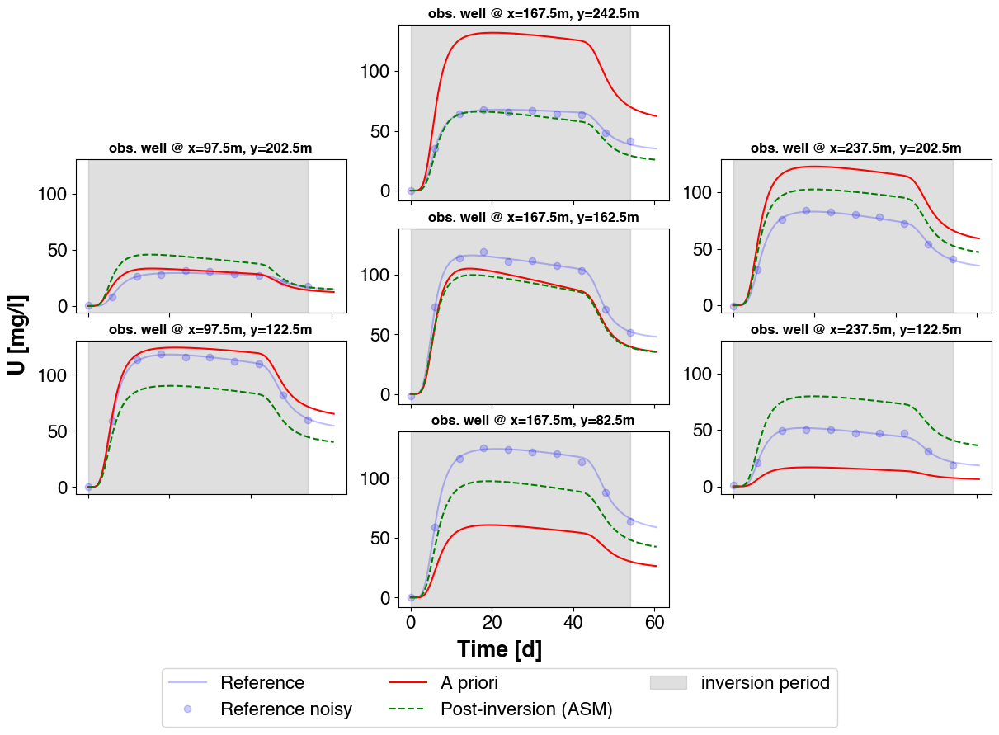

In [ ]:
plot_inv_res_conc_at_producers(
    ref_model=model_reference,
    prior_model=model_estimate,
    inversed_model=model_adjusted_adjoint_full,
    case_name="ASM",
    sp=0,
)

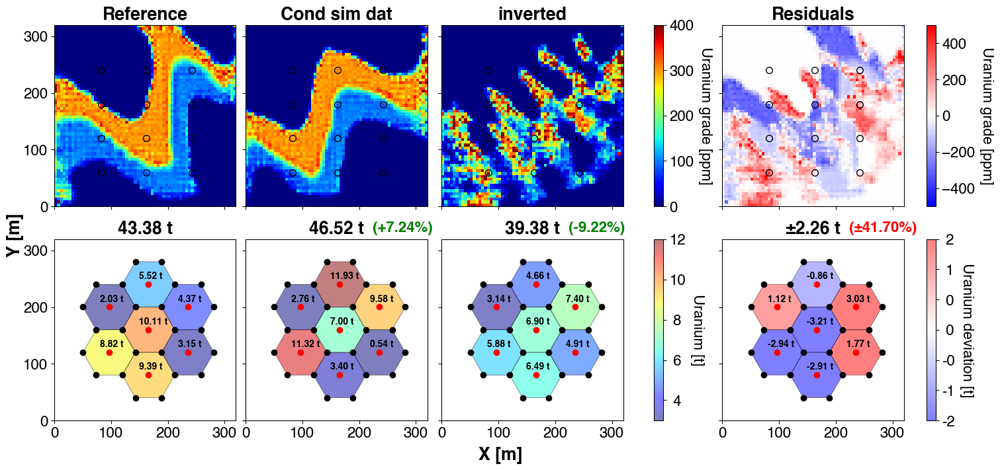

In [ ]:
plot_inv_res_grade_and_reserves(
    ref_grade=reference_grades_ppm,
    prior_grade=estimate_grade_simu_ppm,
    inversed_grade=grade_mol_per_kg_to_ppm(
        model_adjusted_adjoint.tr_model.grade[:, :, 0]
    ),
    case_name="adjoint",
)

In [ ]:
plotter = ngp.AnimatedPlotter(
    fig_params={"figsize": (14.0, 8.0)}, subfigs_params={"nrows": 2, "ncols": 3}
)

# 1 frame per solver iteration
nb_frames: int = inverse_model_adjoint.nb_f_calls

aligned_adjoint_gradients = get_gridded_archived_gradients(
    adjusted_param_adjoint, is_adjoint=True
)

gain = np.max(np.abs(aligned_adjoint_gradients))

# 1) Gradient evolution
plotter.animated_multi_imshow(
    ax_names=["ax1-1"],
    data={
        "Gradient": aligned_adjoint_gradients,
    },
    # cbar_title="Adjoit head",
    nb_frames=nb_frames,
    imshow_kwargs={
        "extent": [0.0, nx * dx, 0.0, ny * dy],
        "aspect": "equal",
        "norm": SymLogNorm(linthresh=0.5),
    },
    # cbar_kwargs={},
    xlabel="X [m]",
    ylabel="Y [m]",
    is_symmetric_cbar=True,
)
plotter.get_axis("ax1-1").set_title("Gradient", fontweight="bold")

if language == Lg.ENGLISH:
    labels = [
        "Uranium grade",
        "Residuals",
        "Cost function",
    ]
else:
    labels = [
        "Teneurs en uranium",
        "Résidus",
        "Fonction de perte",
    ]

# 2) Parameter evolution
plotter.animated_multi_imshow(
    ax_names=["ax1-2"],
    data={
        labels[0]: grade_mol_per_kg_to_ppm(
            np.transpose(
                np.array(adjusted_param_adjoint.archived_values), axes=[1, 2, 0]
            )
        ),
    },
    nb_frames=nb_frames,
    imshow_kwargs={
        "extent": [0.0, nx * dx, 0.0, ny * dy],
        "aspect": "equal",
        # "norm": LogNorm(vmin=1e-5, vmax=1e-3),
        "cmap": plt.get_cmap("jet"),
        "extent": [0.0, nx * dx, 0.0, ny * dy],
        "vmin": 0,
        "vmax": 400,
    },
    xlabel="X [m]",
    ylabel="Y [m]",
)

plotter.get_axis("ax1-2").set_title(f"{labels[0]} [ppm]", fontweight="bold")

# 3) Residuals evolution
plotter.animated_multi_imshow(
    ax_names=["ax1-3"],
    data={
        labels[1]: np.transpose(
            np.array(
                [
                    grade_mol_per_kg_to_ppm(val) - reference_grades_ppm
                    for val in adjusted_param_adjoint.archived_values
                ]
            ),
            axes=[1, 2, 0],
        ),
    },
    nb_frames=nb_frames,
    imshow_kwargs={
        "extent": [0.0, nx * dx, 0.0, ny * dy],
        "aspect": "equal",
        # "norm": LogNorm(vmin=1e-5, vmax=1e-3),
        "cmap": plt.get_cmap("bwr"),
        "extent": [0.0, nx * dx, 0.0, ny * dy],
        "vmin": -300,
        "vmax": 300,
    },
    xlabel="X [m]",
    ylabel="Y [m]",
)
plotter.get_axis("ax1-3").set_title(f"{labels[1]} [ppm]", fontweight="bold")

# 4) Objective function
vals = inverse_model_adjoint.loss_scaled_history
obj_fun_vals = np.full((len(vals), nb_frames), fill_value=np.nan)
for i in range(len(vals)):
    obj_fun_vals[: i + 1, i] = vals[: i + 1]

plotter.animated_multi_plot(
    ax_name="ax2-1",
    data={
        labels[2]: {"y": obj_fun_vals, "kwargs": {"c": "r", "linestyle": "--"}},
    },
    nb_frames=nb_frames,
    title=labels[1],
    xlabel="Iteration #",
)
plotter.ax_dict["ax2-1"].set_yscale("log")

# 5 & 6) Observation vs predicted values
conc_observables = [
    obs
    for obs in observables
    if obs.state_variable == dminv.StateVariable.CONCENTRATION
]

# With this approach, no need for grid data conditioning
# But we keep the observations because we want to vizualize the
# Add well data -> With the uncertainty
# Note: we need one observable per location
grade_observables = [
    obs
    for obs in observables
    if obs.state_variable != dminv.StateVariable.CONCENTRATION
]

if len(grade_observables) == 0:
    for idx, nn in enumerate(dat_nn):
        grade_observables.append(
            dminv.Observable(
                state_variable=dminv.StateVariable.GRADE,
                node_indices=nn,
                times=np.zeros((1)),
                values=grade_ppm_to_mol_per_kg(dat_val_wrong[idx]),
                uncertainties=grade_ppm_to_mol_per_kg(np.sqrt(dat_var_init[idx])),
                sp=0,
            )
        )

conc_obs_init = dminv.get_observables_values_as_1d_vector(conc_observables)
grade_obs_init = dminv.get_observables_values_as_1d_vector(grade_observables)
conc_pred_init = dminv.get_predictions_matching_observations(
    model_estimate, conc_observables
)
conc_pred = np.array(executor_adjoint.inv_model.list_d_pred).T[: conc_pred_init.size, :]
grade_pred = np.array(
    [
        np.array([val.ravel("F")[obs.node_indices] for obs in grade_observables]).ravel(
            "F"
        )
        for val in adjusted_param_adjoint.archived_values
    ]
).T
grade_pred_init = grade_pred[:, 0]

# 5) Concentrations
pyrtid.plot.plot_observed_vs_simulated(
    plotter.ax_dict["ax2-2"],
    obs_vector=conc_molpl_to_mgpl(conc_obs_init),
    pred_vector_initial=conc_molpl_to_mgpl(conc_pred_init),
    units="mg/l",
)
plotter.animated_multi_plot(
    ax_name="ax2-2",
    data={
        "current": {
            "x": conc_molpl_to_mgpl(conc_obs_init),
            "y": conc_molpl_to_mgpl(conc_pred),
            "kwargs": {"c": "b", "linestyle": "none", "marker": ".", "zorder": 2},
        },
    },
    nb_frames=nb_frames,
)
# Add a legend
plotter.get_axis("ax2-2").legend(loc="upper left")

# 6) Grades
pyrtid.plot.plot_observed_vs_simulated(
    plotter.ax_dict["ax2-3"],
    obs_vector=grade_mol_per_kg_to_ppm(grade_obs_init),
    pred_vector_initial=grade_mol_per_kg_to_ppm(grade_pred_init),
    units="ppm",
)
plotter.animated_multi_plot(
    ax_name="ax2-3",
    data={
        "current": {
            "x": grade_mol_per_kg_to_ppm(grade_obs_init),
            "y": grade_mol_per_kg_to_ppm(grade_pred),
            "kwargs": {"c": "b", "linestyle": "none", "marker": ".", "zorder": 2},
        },
    },
    nb_frames=nb_frames,
)
# Add a legend
plotter.get_axis("ax2-2").legend(loc="upper left")

plotter.close()
plotter.animate(nb_frames=nb_frames)
# Save the animation locally on the computer
fname_html = fig_save_path.joinpath("inversion_animation_adjoint.html")
writer = HTMLWriter(fps=2, embed_frames=True)
writer.frame_format = "svg"  # Ensure svg format
plotter.animation.save(str(fname_html), writer=writer)

# Extract the svg from the html file (for animation in Latex)
ngp.extract_frames_from_embedded_html_animation(fname_html)

# Display the animation
HTML(fname_html.read_text())

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>
